# Load Data

In [1]:
import torch
from skimage.restoration import unwrap_phase, denoise_tv_chambolle
import numpy as np
import tifffile as tif
import matplotlib.pyplot as plt
from matplotlib import colors
import sys, time
from scipy import ndimage
from scipy.fft import fftshift

from torch.cuda import get_device_name
print("GPU:", get_device_name(0))

GPU: NVIDIA GeForce GTX 1070


In [2]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [3]:
sys.path.append('/home/connor/Documents/Phase_Reconstruction/')
from microscopes_fwd import Microscope
from microscopes_fwd import Plot_ColorMap

In [4]:
# truth for amplitude and phase

true_phase = np.load('/home/connor/Documents/Phase_Reconstruction/GB Simulation/true_phase.npy')
true_amp = np.load('/home/connor/Documents/Phase_Reconstruction/GB Simulation/true_amp.npy')

In [5]:
TEM = Microscope(Cs = 1.0e6, theta_c = 0.1e-3, def_spr = 5)
true_thickness = np.log(true_amp)*-200
true_potential = true_phase / (TEM.sigma*true_thickness)

/tmp/ipykernel_2918/934776594.py:3: RuntimeWarning: invalid value encountered in divide
  true_potential = true_phase / (TEM.sigma*true_thickness)


# Optimizations

In [31]:
def compute_loss():
    tf_obj = guess_amp * torch.exp(1j*guess_phase)
    cal_data = torch.fft.ifft2(torch.fft.fft2(tf_obj)*TF)
    cal_data = torch.abs(cal_data)
    cal_data /= torch.mean(cal_data, dim=(1,2), keepdims=True)
    return torch.mean((cal_data - exp_data)**2)

In [30]:
def training_loop(optimizer, scheduler, n=1000):
    "Training loop for torch model."
    losses = np.zeros(n)
    for i in range(n):
        loss = compute_loss()
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        scheduler.step(loss)
        losses[i] = loss
    return losses

In [33]:
#Post reconstruction low-pass filter
def wave_correct(amp, phase, ap):
    wave = amp * np.exp(1j*phase)
    wave_fft = np.fft.fftshift(np.fft.fft2(wave))
    wave_filtered = np.fft.ifft2(np.fft.fftshift(ap*wave_fft))
    t2 = unwrap_phase(np.angle(wave_filtered)) #Phase unwrap may not be necessary
    t2 -= t2[:64,:64].mean() #Set 0 point
    return t2[384:-384, 256:-256]

In [42]:
# For creating additional noisy images
factor = true_amp[384:-384,:].mean()**2
def make_pnoise(image, noise_level):
    lam = 1/(factor*noise_level**2)
    image_n_filt = np.random.poisson(image * lam) / float(lam)
    return image_n_filt

In [28]:
### NB: this version of transfer function code follows sign convention under-focus>0

#Logarithmic defocus series
index = np.arange(1.2, 6.2, 0.2)
defocus=np.zeros(2*len(index)+1)
defocus[-len(index):] = 10**index
index = np.flip(index)
defocus[:len(index)] = -10**index
n_def = len(defocus)

#inititiate microscope class
TEM = Microscope(Cs = 1.0e6, theta_c = 0.1e-3, def_spr = 5)

#reciprocal space vectors
[dim,dim] = true_amp.shape
d2=dim/2
line = np.arange(dim)-float(d2)
[X,Y] = np.meshgrid(line,line)
qq = np.sqrt(X**2 + Y**2) / float(dim)

# define pixel resolution in nm.
del_px = 0.1 #nm/px

tf_microscope = np.zeros(A_samples.shape, dtype=np.complex64)

for i in range(defocus.shape[0]):
    TEM.defocus = defocus[i]
    tf_microscope[i,:,:] = TEM.getTransferFunction(qq, del_px)

In [45]:
A_noise0 = np.load('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Images/imgstack_ap_noise0.npy')

In [35]:
#Define objective aperture, used for post-reconstruction low-pass filtering
aperture = np.zeros([1024, 1024])
line = np.arange(-512,512)
[X,Y] = np.meshgrid(line,line)
aperture[np.sqrt(X**2+Y**2)<1024./5]=1
aperture = ndimage.gaussian_filter(aperture, sigma=2)

In [48]:
#Find which combination of two defocus pairs gives most accurate reconstructed potential map

files = ['/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Images/imgstack_ap_noise2.npy',
         '/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Images/imgstack_ap_noise5.npy',
         '/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Images/imgstack_ap_noise10.npy',
         '/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Images/imgstack_ap_noise20.npy']
noise = [2, 5, 10, 20]
prefix = '/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/optimizations/ap_noise'

t1 = np.copy(true_potential[384:-384, 256:-256])
t1 -= t1.mean()
shift = -t1[0,0]
t1 += shift
        
for k in range(4):
    A_samples = np.load(files[k])
    result_potential = np.zeros([325,256,512])
    loss_iter = np.zeros([25, 25])
    acc = np.zeros([25, 25])
    weight = np.sqrt(A_samples[25,384:-384,256:-256]).std()
    amp_guess = denoise_tv_chambolle(np.sqrt(A_samples[25]), weight=weight)
    phase_guess = TEM.sigma*np.log(amp_guess)*-200*20
    alt_samples = np.zeros((5, 1024, 1024))
    A_samples_alt = np.zeros([51, 1024, 1024])
    for i in range(51):
        A_samples_alt[i] = make_pnoise(A_noise0[i,:,:], noise[k]/100)
    alt_samples[2,:,:] = A_samples[25,:,:]
    ind=0
    
    for i in range(0, 25):
        for j in range(i, 25):
            selection = [i, j, 25, 50-j, 50-i]
            TF = torch.from_numpy(fftshift(tf_microscope[selection], axes=(1,2))).to(device)
            if i==j:
                alt_samples[0] = A_samples[i]
                alt_samples[1] = A_samples_alt[j]
                alt_samples[3] = A_samples[50-i]
                alt_samples[4] = A_samples_alt[50-j]
                exp_data = torch.from_numpy(np.sqrt(alt_samples).astype(np.float32)).to(device)
            else:
                exp_data = torch.from_numpy(np.sqrt(A_samples[selection]).astype(np.float32)).to(device)
            exp_data /= torch.mean(exp_data, dim=(1,2), keepdims=True)
            guess_amp = torch.tensor(amp_guess, dtype=torch.float32, requires_grad=True, device=device)
            guess_phase = torch.tensor(phase_guess, dtype=torch.float32, requires_grad=True, device=device)
            opt = torch.optim.Adam([guess_phase, guess_amp], lr=0.1, eps=1e-16)
            scheduler1 = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, mode='min', factor=0.5, patience=50, threshold=0.0001, 
                                                                    threshold_mode='rel', cooldown=50, min_lr=0, eps=1e-6, verbose=False)
            losses = training_loop(opt, scheduler1, n=500) 
            loss_iter[i] = losses[-1]
            phase = guess_phase.cpu().detach().numpy()
            amp = guess_amp.cpu().detach().numpy()
            phase = unwrap_phase(phase)
            t2 = wave_correct(amp, phase, aperture)
            t2 = t2/(TEM.sigma*true_thickness[384:-384,256:-256])
            t2 -= t2.mean()
            t2 += shift
            result_potential[ind,:,:] = t2
            acc[i,j] = 1 - np.arccos(np.sum(t1*t2)/(np.sqrt(np.sum(t1**2)) * np.sqrt(np.sum(t2**2))))/np.pi
            ind+=1
    print(k)
    for i in range(25):
        acc[:,i] = acc[i,:]
    acc = np.flip(acc, axis=2)
    np.save(prefix+str(noise[k])+'_acc_opt', acc)
    np.save(prefix+str(noise[k])+'_potential_opt', result_potential)

0
1
2
3


In [9]:
acc_all = np.zeros((4, 25, 25))
acc_all[0,:,:] = np.load('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/optimizations/ap_noise2_acc_opt.npy')
acc_all[1,:,:] = np.load('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/optimizations/ap_noise5_acc_opt.npy')
acc_all[2,:,:] = np.load('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/optimizations/ap_noise10_acc_opt.npy')
acc_all[3,:,:] = np.load('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/optimizations/ap_noise20_acc_opt.npy')

In [21]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

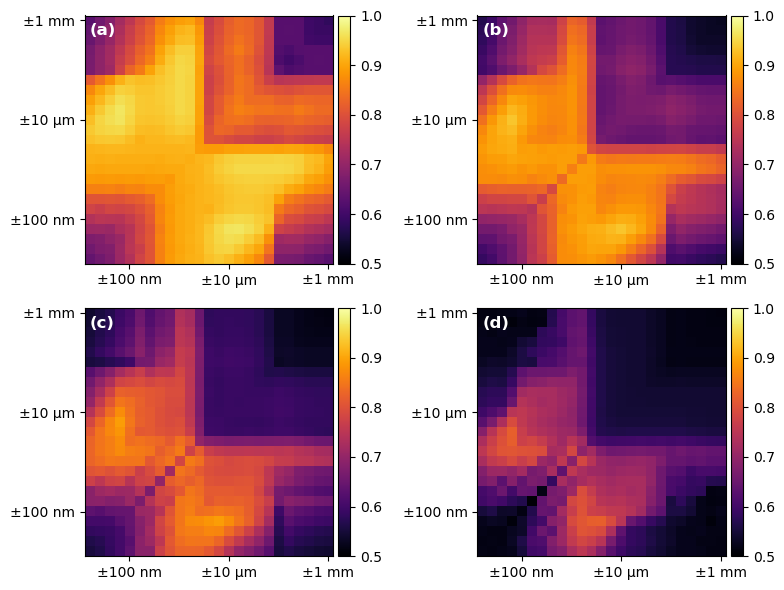

In [22]:
f, ax = plt.subplots(nrows=2, ncols=2, figsize=(8,6), dpi=300)
pm = u'\u00B1'
titles = ['2% Noise', '5% Noise', '10% Noise', '20% Noise']
ind=0
texts = ['(a)','(b)','(c)','(d)']
for axis in ax.reshape(-1):
    im = axis.imshow(acc_all[ind], interpolation='none', cmap='inferno')
    im.set_clim(0.5,1)
    divider = make_axes_locatable(axis)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    f.colorbar(im, cax=cax)
    axis.set_xticks([4, 14, 24])
    axis.set_yticks([0, 10, 20])
    axis.set_xticklabels([pm+'100 nm', pm+'10 μm', pm+'1 mm'])
    axis.set_yticklabels([pm+'1 mm', pm+'10 μm', pm+'100 nm'])
    axis.text(0, 1.5, texts[ind], color='white', fontsize='large', fontweight='bold')
    ind+=1
plt.tight_layout()
plt.savefig('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/optimizations/2_opt_potential.pdf')

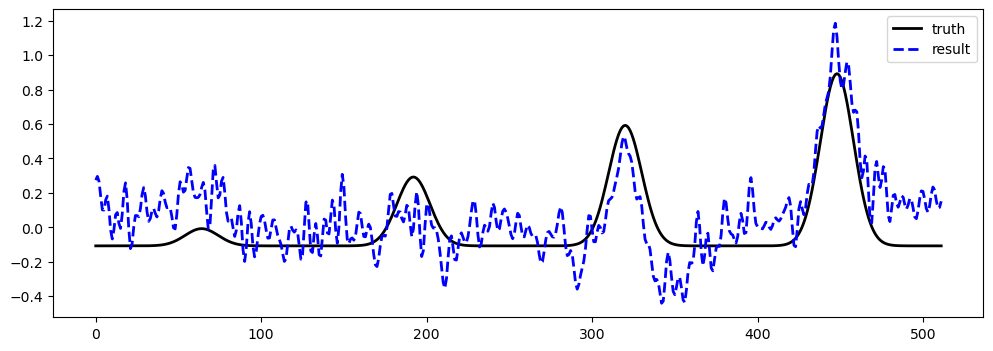

In [65]:
fig, ax = plt.subplots(figsize=(12,4))
ax.plot(t1[128,:], 'k-', linewidth=2)
ax.plot(result_potential[275, 128,:], 'b--', linewidth=2)
ax.legend(['truth', 'result'])

In [ ]:
#Find optimum single defocus pair from 5% noise images

file = '/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Images/imgstack_ap_noise5.npy'

A_samples = np.load(file)
acc1 = np.zeros(25)
weight = np.sqrt(A_samples[25,384:-384,256:-256]).std()
amp_guess = denoise_tv_chambolle(np.sqrt(A_samples[25]), weight=weight)
phase_guess = TEM.sigma*np.log(amp_guess)*-200*20
    
for i in range(0, 25):
    selection = [i, 25, 50-i]
    TF = torch.from_numpy(fftshift(tf_microscope[selection], axes=(1,2))).to(device)
    exp_data = torch.from_numpy(np.sqrt(A_samples[selection]).astype(np.float32)).to(device)
    exp_data /= torch.mean(exp_data, dim=(1,2), keepdims=True)
    guess_amp = torch.tensor(amp_guess, dtype=torch.float32, requires_grad=True, device=device)
    guess_phase = torch.tensor(phase_guess, dtype=torch.float32, requires_grad=True, device=device)
    opt = torch.optim.Adam([guess_phase, guess_amp], lr=0.1, eps=1e-16)
    scheduler1 = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, mode='min', factor=0.5, patience=50, threshold=0.0001, 
                                                            threshold_mode='rel', cooldown=50, min_lr=0, eps=1e-6, verbose=False)
    losses = training_loop(opt, scheduler1, n=1000) 
    phase = guess_phase.cpu().detach().numpy()
    amp = guess_amp.cpu().detach().numpy()
    phase = unwrap_phase(phase)
    t2 = wave_correct(amp, phase, aperture)
    t2 = t2/(TEM.sigma*true_thickness[384:-384,256:-256])
    t2 -= t2.mean()
    t2 += shift
    acc1[i] = 1 - np.arccos(np.sum(t1*t2)/(np.sqrt(np.sum(t1**2)) * np.sqrt(np.sum(t2**2))))/np.pi

In [122]:
#Find optimum third defocus pair, given two fixed pairs, from 5% noise images

file = '/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Images/imgstack_ap_noise5.npy'

A_samples = np.load(file)
acc3 = np.zeros(25)
weight = np.sqrt(A_samples[25,384:-384,256:-256]).std()
amp_guess = denoise_tv_chambolle(np.sqrt(A_samples[25]), weight=weight)
phase_guess = TEM.sigma*np.log(amp_guess)*-200*20
    
for i in range(0, 25):
    if i==11 or i==21:
        continue
    selection = [i, 11, 21, 25, 29, 39, 50-i]
    TF = torch.from_numpy(fftshift(tf_microscope[selection], axes=(1,2))).to(device)
    exp_data = torch.from_numpy(np.sqrt(A_samples[selection]).astype(np.float32)).to(device)
    exp_data /= torch.mean(exp_data, dim=(1,2), keepdims=True)
    guess_amp = torch.tensor(amp_guess, dtype=torch.float32, requires_grad=True, device=device)
    guess_phase = torch.tensor(phase_guess, dtype=torch.float32, requires_grad=True, device=device)
    opt = torch.optim.Adam([guess_phase, guess_amp], lr=0.1, eps=1e-16)
    scheduler1 = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, mode='min', factor=0.5, patience=50, threshold=0.0001, 
                                                            threshold_mode='rel', cooldown=50, min_lr=0, eps=1e-6, verbose=False)
    losses = training_loop(opt, scheduler1, n=1000) 
    phase = guess_phase.cpu().detach().numpy()
    amp = guess_amp.cpu().detach().numpy()
    phase = unwrap_phase(phase)
    t2 = wave_correct(amp, phase, aperture)
    t2 = t2/(TEM.sigma*true_thickness[384:-384,256:-256])
    t2 -= t2.mean()
    t2 += shift
    acc3[i] = 1 - np.arccos(np.sum(t1*t2)/(np.sqrt(np.sum(t1**2)) * np.sqrt(np.sum(t2**2))))/np.pi

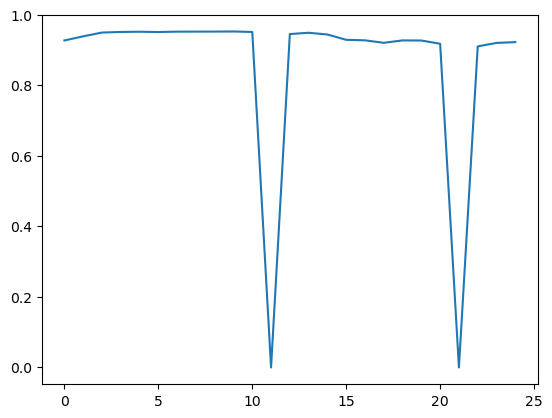

In [123]:
plt.plot(np.arange(0, 25), acc3)

In [36]:
files = ['/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Images/imgstack_ap_noise2.npy',
         '/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Images/imgstack_ap_noise5.npy',
         '/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Images/imgstack_ap_noise10.npy',
         '/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Images/imgstack_ap_noise20.npy']

acc_combined = np.zeros((4,3))

for i in range(4):
    A_samples = np.load(files[i])
    weight = np.sqrt(A_samples[25,384:-384,256:-256]).std()
    amp_guess = denoise_tv_chambolle(np.sqrt(A_samples[25]), weight=weight)
    phase_guess = TEM.sigma*np.log(amp_guess)*-200*20
    for j in range(3):
        if j==0:
            selection = [15, 25, 35]
        if j==1:
            selection = [11, 21, 25, 29, 39]
        if j==2:
            selection = [9, 11, 21, 25, 29, 39, 41]
        TF = torch.from_numpy(fftshift(tf_microscope[selection], axes=(1,2))).to(device)
        exp_data = torch.from_numpy(np.sqrt(A_samples[selection]).astype(np.float32)).to(device)
        exp_data /= torch.mean(exp_data, dim=(1,2), keepdims=True)
        guess_amp = torch.tensor(amp_guess, dtype=torch.float32, requires_grad=True, device=device)
        guess_phase = torch.tensor(phase_guess, dtype=torch.float32, requires_grad=True, device=device)
        opt = torch.optim.Adam([guess_phase, guess_amp], lr=0.1, eps=1e-16)
        scheduler1 = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, mode='min', factor=0.5, patience=50, threshold=0.0001, 
                                                                threshold_mode='rel', cooldown=50, min_lr=0, eps=1e-6, verbose=False)
        losses = training_loop(opt, scheduler1, n=1000) 
        phase = guess_phase.cpu().detach().numpy()
        amp = guess_amp.cpu().detach().numpy()
        phase = unwrap_phase(phase)
        t2 = wave_correct(amp, phase, aperture)
        t2 = t2/(TEM.sigma*true_thickness[384:-384,256:-256])
        t2 -= t2.mean()
        t2 += shift
        acc_combined[i,j] = 1 - np.arccos(np.sum(t1*t2)/(np.sqrt(np.sum(t1**2)) * np.sqrt(np.sum(t2**2))))/np.pi

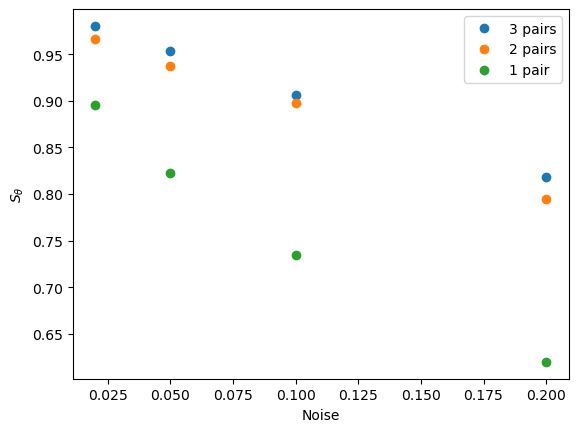

In [37]:
plt.figure(dpi=300)
plt.plot([0.02, 0.05, 0.1, 0.2], np.flip(acc_combined, axis=1), 'o')
plt.xlabel('Noise')
plt.ylabel('$S_{θ}$')
plt.legend(['3 pairs', '2 pairs', '1 pair'])
plt.savefig('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/S5_defocus_pairs.pdf', bbox_inches='tight')

In [51]:
noise = np.array([0.02, 0.05, 0.1, 0.2])
headers = np.array([['', 'S_theta', 'S_theta', 'S_theta'],
                    ['Noise', '1 pair', '2 pairs', '3 pairs']])
str_acc = np.char.mod("%10.6f", np.concatenate((noise[:,np.newaxis], acc_combined), axis=1))
with open('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/figure_csv/S5_defocus_pairs.csv', 'w') as f:
    np.savetxt(f, np.vstack((headers, str_acc)), delimiter=', ', fmt='%s')

# AD Reconstruction

In [18]:
A_samples = np.load('/home/connor/Documents/holog/Sim_Images/imgstack_ap_noise5.npy')

In [7]:
### NB: this version of transfer function code follows sign convention under-focus>0

#Logarithmic defocus series
index = np.arange(1.2, 6.2, 0.2)
defocus=np.zeros(2*len(index)+1)
defocus[-len(index):] = 10**index
index = np.flip(index)
defocus[:len(index)] = -10**index
n_def = len(defocus)

#inititiate microscope class
TEM = Microscope(Cs = 1.0e6, theta_c = 0.1e-3, def_spr = 5)

#reciprocal space vectors
[dim,dim] = true_amp.shape
d2=dim/2
line = np.arange(dim)-float(d2)
[X,Y] = np.meshgrid(line,line)
qq = np.sqrt(X**2 + Y**2) / float(dim)

# define pixel resolution in nm.
del_px = 0.1 #nm/px

tf_microscope = np.zeros(A_samples.shape, dtype=np.complex64)

for i in range(defocus.shape[0]):
    TEM.defocus = defocus[i]
    tf_microscope[i,:,:] = TEM.getTransferFunction(qq, del_px)


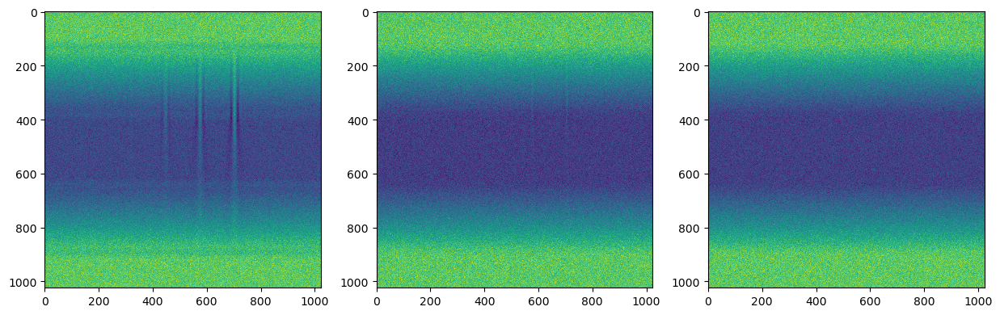

In [71]:
f, axs = plt.subplots(ncols=3, figsize = (15,8))
axs[0].imshow(A_samples[15], interpolation='none')
axs[1].imshow(A_samples[20], interpolation='none')
axs[2].imshow(A_samples[25], interpolation='none')

In [68]:
selection = [11, 21, 25, 29, 39]
print("chosen defocus (nm): ", defocus[selection])

TF = torch.from_numpy(fftshift(tf_microscope[selection], axes=(1,2))).to(device)
exp_data = torch.from_numpy(np.sqrt(A_samples[selection]).astype(np.float32)).to(device)
exp_data /= torch.mean(exp_data, dim=(1,2), keepdims=True)

chosen defocus (nm):  [-6309.5734448    -63.09573445     0.            63.09573445
  6309.5734448 ]


In [32]:
def compute_loss():
    tf_obj = guess_amp * torch.exp(1j*guess_phase)
    cal_data = torch.fft.ifft2(torch.fft.fft2(tf_obj)*TF)
    cal_data = torch.abs(cal_data)
    cal_data /= torch.mean(cal_data, dim=(1,2), keepdims=True)
    return torch.mean((cal_data - exp_data)**2)

In [69]:
weight = np.sqrt(A_samples[25,384:-384,256:-256]).std()
guess_amp = denoise_tv_chambolle(np.sqrt(A_samples[25]), weight=weight)
guess_phase = torch.tensor(TEM.sigma*np.log(guess_amp)*-200*20, dtype=torch.float32, requires_grad=True, device=device)
guess_amp = torch.tensor(guess_amp, dtype=torch.float32, requires_grad=True, device=device)
all_losses = np.array([])

In [30]:
def training_loop(optimizer, scheduler, n=1000):
    "Training loop for torch model."
    losses = np.zeros(n)
    for i in range(n):
        loss = compute_loss()
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        scheduler.step(loss)
        losses[i] = loss
    return losses

In [70]:
time0 = time.time()
opt = torch.optim.Adam([guess_phase], lr=0.1, eps=1e-16)
opt.add_param_group({'params': guess_amp,
                    'lr': 0.1,
                    'eps': 1e-16})
scheduler1 = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, mode='min', factor=0.5, patience=50, threshold=0.0001, threshold_mode='rel', cooldown=50, min_lr=0, eps=1e-6, verbose=False)
losses = training_loop(opt, scheduler1, n=2000)
all_losses = np.append(all_losses, losses)
time1 = time.time()

3.6751e-12
2.2334638e-12


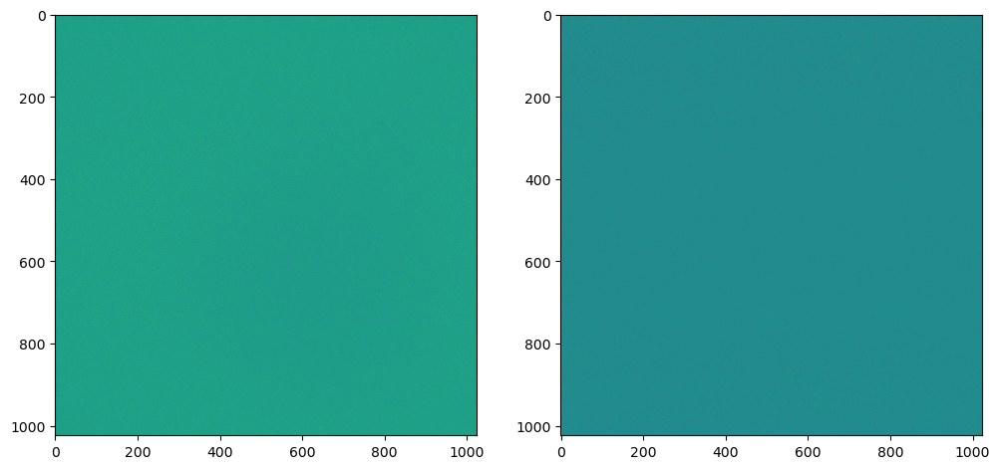

In [71]:
loss2 = compute_loss()
loss2.backward()
grad_phase = guess_phase.grad.cpu().detach().numpy()
grad_amp = guess_amp.grad.cpu().detach().numpy()
opt.zero_grad()
print(np.mean(np.abs(grad_phase)))
print(np.mean(np.abs(grad_amp)))
f, ax = plt.subplots(ncols=2, figsize=(12,8))
ax[0].imshow(grad_phase)
ax[1].imshow(grad_amp)

Text(0.5, 1.0, 'err')

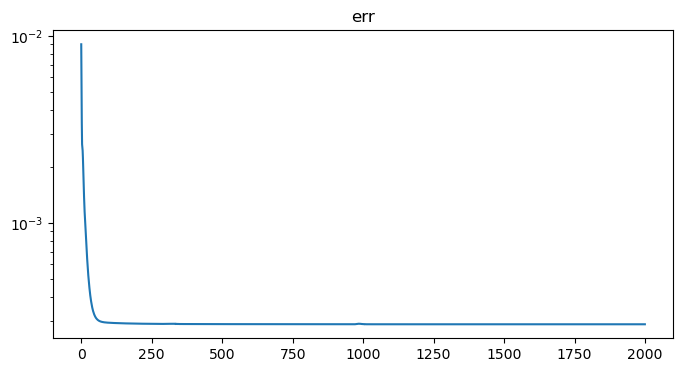

In [72]:
plt.figure(figsize = (8,4))
plt.semilogy(all_losses)
plt.title("err")

# Data Processing

In [37]:
true_thickness = np.log(true_amp)*-200
true_potential = true_phase / (TEM.sigma*true_thickness)

/tmp/ipykernel_146080/713264704.py:2: RuntimeWarning: invalid value encountered in divide
  true_potential = true_phase / (TEM.sigma*true_thickness)


In [36]:
true_V_crop = np.array(true_potential[384:-384,256:-256])
true_V_crop -= true_V_crop.mean()

In [209]:
result_phase = guess_phase.cpu().detach().numpy()
phase_unwrap = unwrap_phase(result_phase)
phase_unwrap -= phase_unwrap[:64,:64].mean()
result_amp = guess_amp.cpu().detach().numpy()
result_amp /= result_amp[:64, :64].mean()
result_thickness = np.log(result_amp)*-200

In [210]:
result_potential = phase_unwrap/(TEM.sigma*true_thickness)
result_V_crop = np.array(result_potential[384:-384, 256:-256])
result_V_crop -= result_V_crop.mean()

/tmp/ipykernel_79305/2127539001.py:1: RuntimeWarning: divide by zero encountered in divide
  result_potential = phase_unwrap/(TEM.sigma*true_thickness)


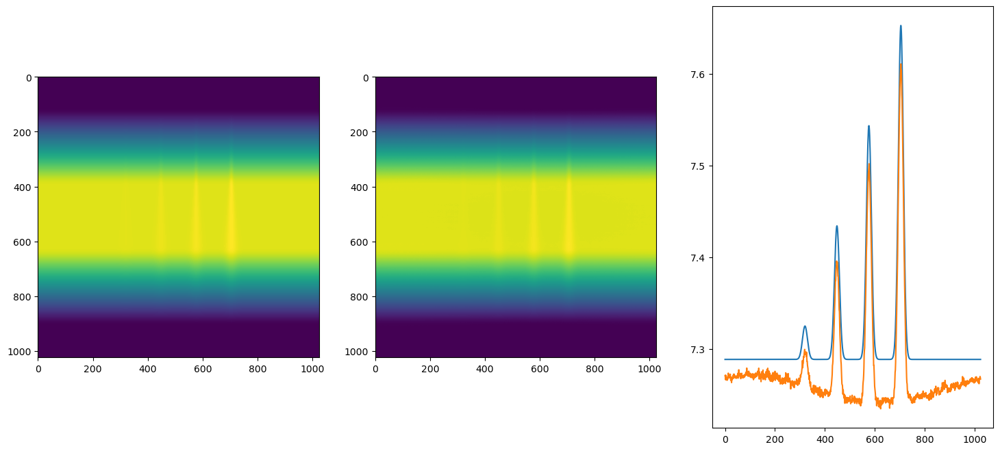

In [211]:
#Show Phase
f, ax = plt.subplots(ncols=3, figsize=(18,8))
ax[0].imshow(true_phase, interpolation='none', norm=colors.Normalize(true_phase.min(),true_phase.max()))
ax[1].imshow(phase_unwrap, interpolation='none', norm=colors.Normalize(true_phase.min(),true_phase.max()))
ax[2].plot(true_phase[512,:])
ax[2].plot(phase_unwrap[512,:])

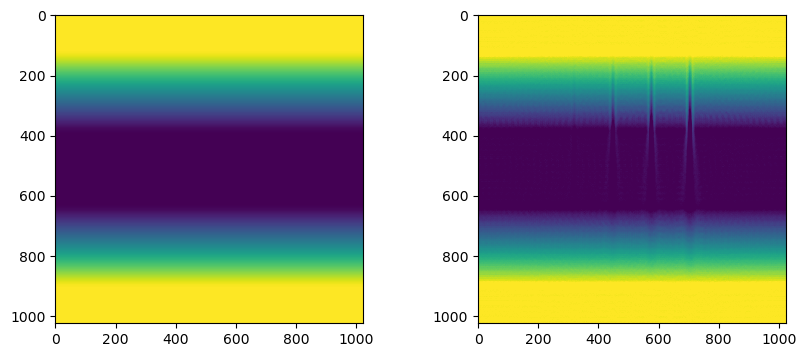

In [212]:
#Show Amplitude
f, ax = plt.subplots(ncols=2, figsize=(10,4))
ax[0].imshow(true_amp, interpolation='none', norm=colors.Normalize(true_amp.min(), true_amp.max()))
ax[1].imshow(result_amp, interpolation='none', norm=colors.Normalize(true_amp.min(), true_amp.max()))

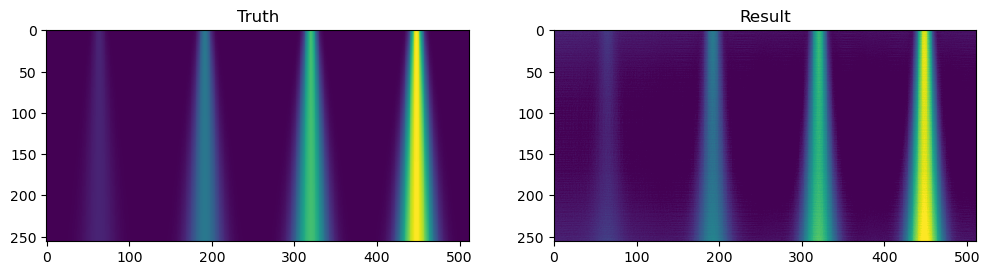

In [213]:
#Show Potential
f, ax = plt.subplots(ncols=2, figsize = (12,8))
ax[0].imshow(true_V_crop, interpolation='none')
ax[0].set_title("Truth")
ax[1].imshow(result_V_crop, interpolation='none', vmin=true_V_crop.min(), vmax=true_V_crop.max())
ax[1].set_title("Result");

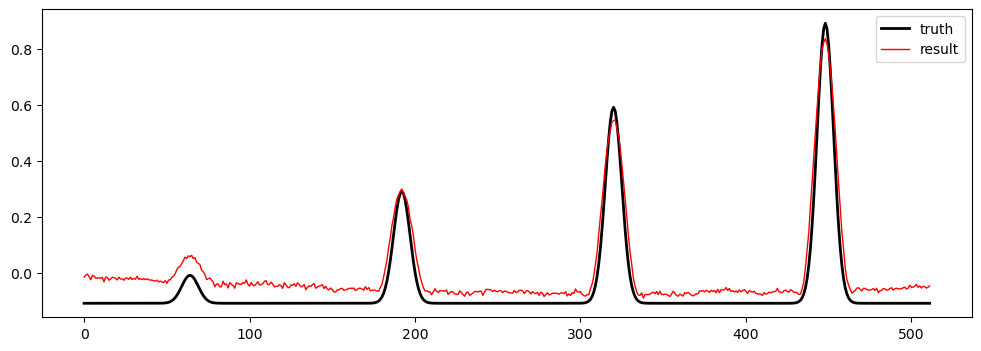

In [214]:
fig, ax = plt.subplots(figsize=(12,4))
ax.plot(true_V_crop[0,:], 'k-', linewidth=2)
ax.plot(result_V_crop[0,:], 'r-', linewidth=1)
ax.legend(['truth', 'result'])

# Aperture Correction

(0.0, 500.0)

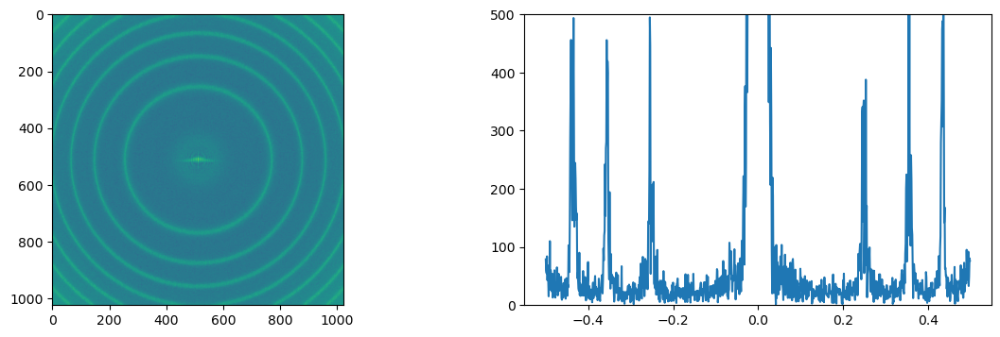

In [79]:
wave = result_amp * np.exp(1j*phase_unwrap)
wave_fft = np.fft.fftshift(np.fft.fft2(wave))
f, ax = plt.subplots(ncols=2, figsize = (14,4))
ax[0].imshow(np.log10(np.abs(wave_fft)))
ax[1].plot(np.arange(-512,512)/1024, np.abs(wave_fft[:,512]))
ax[1].set_ylim((0, 500))

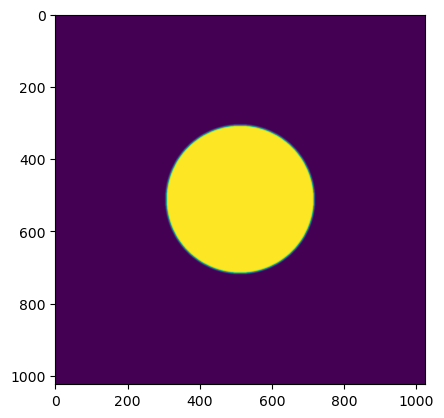

In [34]:
aperture = np.zeros([1024, 1024])
line = np.arange(-512,512)
[X,Y] = np.meshgrid(line,line)
aperture[np.sqrt(X**2+Y**2)<1024./5]=1
aperture = ndimage.gaussian_filter(aperture, sigma=2)
plt.imshow(aperture)

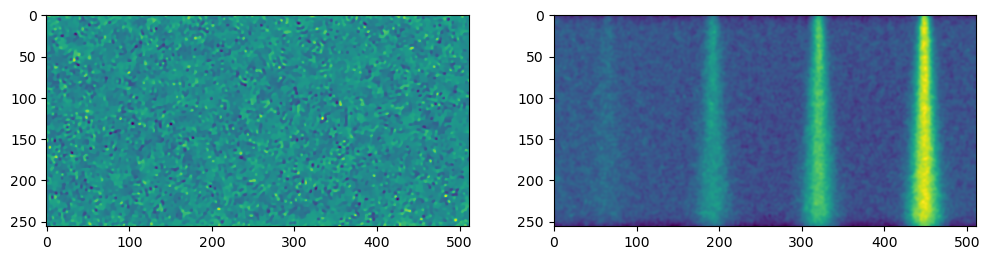

In [81]:
wave_filtered = np.fft.ifft2(np.fft.fftshift(aperture*wave_fft))
amp_filtered = np.abs(wave_filtered)
amp_filtered /= amp_filtered[:64, :64].mean()
weight = amp_filtered[384:-384, 256:-256].std()
amp_denoise = denoise_tv_chambolle(amp_filtered, weight=weight)
amp_denoise /= amp_denoise[:64, :64].mean()
phase_filtered = unwrap_phase(np.angle(wave_filtered))
phase_filtered -= phase_filtered[:64, :64].mean()
f, ax = plt.subplots(ncols=2, figsize = (12,8))
ax[0].imshow(amp_denoise[384:-384, 256:-256])
ax[1].imshow(phase_filtered[384:-384, 256:-256])

(0.0, 500.0)

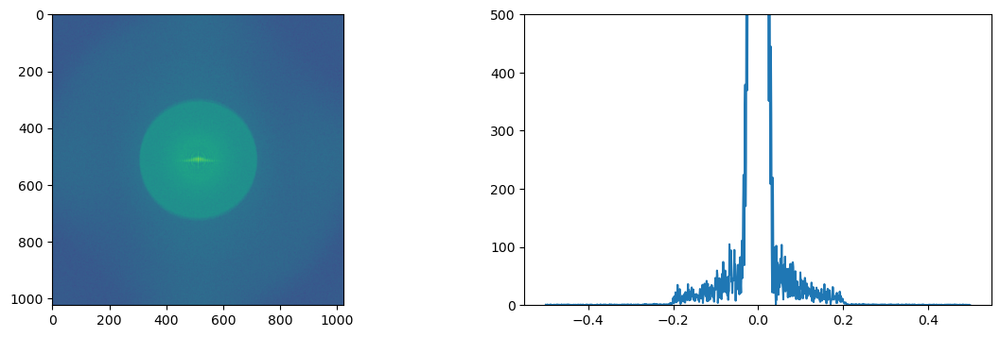

In [82]:
wave_filtered = amp_denoise * np.exp(1j*phase_filtered)
wave_fft_filtered = np.fft.fftshift(np.fft.fft2(wave_filtered))
f, ax = plt.subplots(ncols=2, figsize = (14,4))
ax[0].imshow(np.log10(np.abs(wave_fft_filtered)))
ax[1].plot(np.arange(-512,512)/1024, np.abs(wave_fft_filtered[:,512]))
ax[1].set_ylim((0, 500))

(0.0, 1.0)

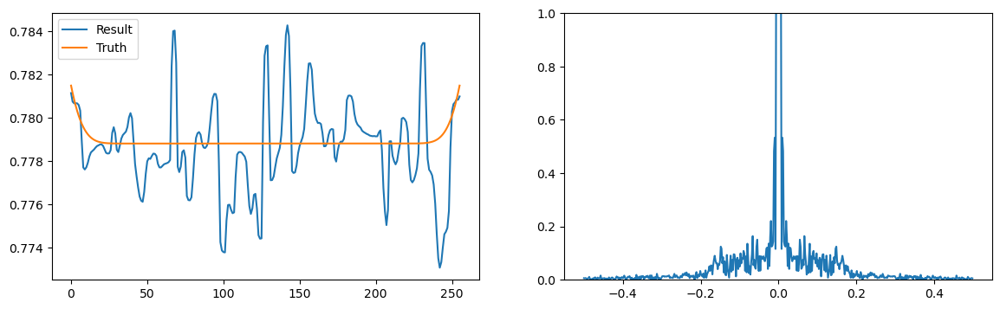

In [83]:
f, ax = plt.subplots(ncols=2, figsize = (14,4))
ax[0].plot(amp_denoise[384:-384,512])
ax[0].plot(true_amp[384:-384, 512])
ax[0].legend(['Result','Truth'])
ax[1].plot(np.arange(-256, 256)/512, np.abs(np.fft.fftshift(np.fft.fft(amp_denoise[256:-256,512]))))
ax[1].set_ylim((0, 1))

In [84]:
thickness_filtered = np.log(amp_filtered)*-200
potential_filtered = phase_filtered/(TEM.sigma*true_thickness)

/tmp/ipykernel_146080/1397479400.py:2: RuntimeWarning: divide by zero encountered in divide
  potential_filtered = phase_filtered/(TEM.sigma*true_thickness)


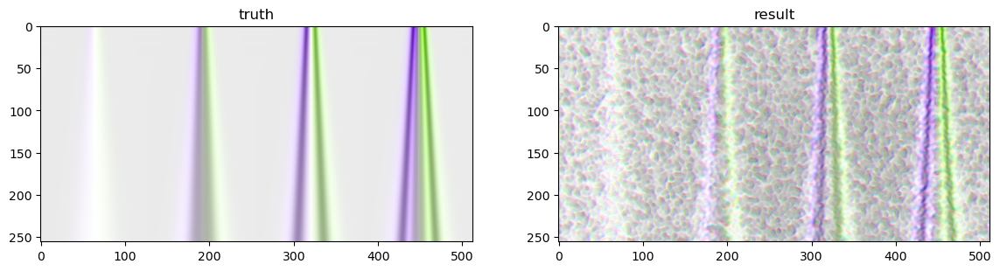

In [85]:
# show phase gradient
f, ax = plt.subplots(ncols=2, figsize = (14,8))

t1=ndimage.gaussian_filter(true_potential[384:-384, 256:-256],2,order=0)
gx1=np.gradient(t1,axis=0)
gy1=np.gradient(t1,axis=1)
rgb_map=Plot_ColorMap(Bx=gx1, By=gy1, hsvwheel=True)
ax[0].imshow(rgb_map)
ax[0].set_title("truth")
ax[0].imshow(np.cos(t1*10), cmap="gray", alpha=.3, vmin=-1, vmax=1)

t2=ndimage.gaussian_filter(potential_filtered[384:-384, 256:-256],2,order=0)
gx2=np.gradient(t2,axis=0)
gy2=np.gradient(t2,axis=1)
rgb_map=Plot_ColorMap(Bx=gx2, By=gy2, hsvwheel=True)
ax[1].imshow(rgb_map)
ax[1].imshow(np.cos(t2*10), cmap="gray", alpha=.3, vmin=-1, vmax=1)
ax[1].set_title("result");

In [86]:
V_filtered_crop = np.array(potential_filtered[384:-384,256:-256])
V_filtered_crop -= V_filtered_crop.mean()

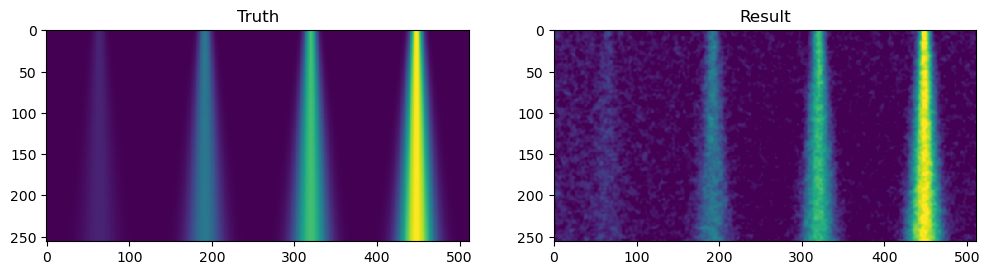

In [87]:
# show phase
f, ax = plt.subplots(ncols=2, figsize = (12,8))
ax[0].imshow(true_V_crop, interpolation='none')
ax[0].set_title("Truth")
ax[1].imshow(V_filtered_crop, interpolation='none', vmin=true_V_crop.min(), vmax=true_V_crop.max())
ax[1].set_title("Result");

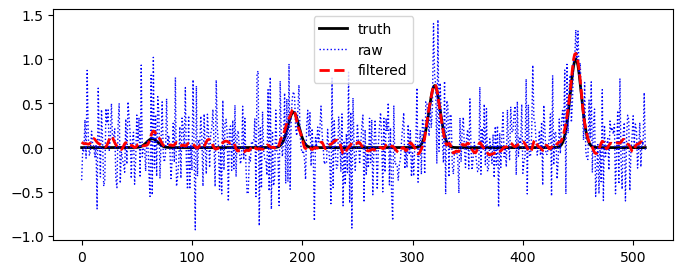

In [88]:
shift=-true_V_crop.min()
fig, ax = plt.subplots(figsize=(8,3))
ax.plot(true_V_crop[0,:]+shift, 'k-', linewidth=2)
ax.plot(result_V_crop[0,:]+shift, 'b:', linewidth=1)
ax.plot(V_filtered_crop[0,:]+shift, 'r--', linewidth=2)
ax.legend(['truth', 'raw', 'filtered'])

In [159]:
np.save('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/ap_noise20/losses', all_losses)
np.save('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/ap_noise20/phase', phase_filtered)
np.save('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/ap_noise20/amp', amp_filtered)
np.save('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/ap_noise20/potential', V_filtered_crop)

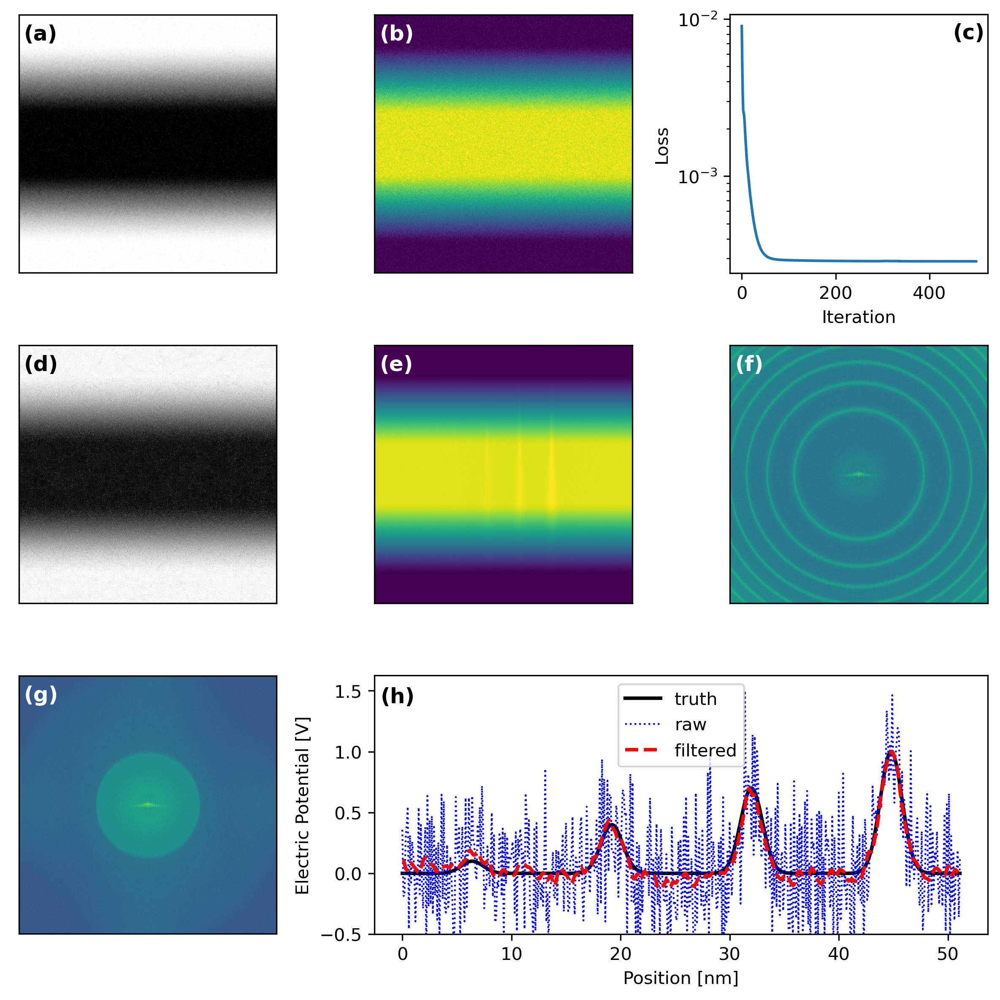

In [109]:
f, ax = plt.subplots(nrows=3, ncols=3, figsize=(8,8), dpi=300, layout='tight')
gs = ax[2,1].get_gridspec()
for axis in ax[2,1:]:
    axis.remove()
ax_big = f.add_subplot(gs[2, 1:])
ax[0,0].imshow(guess_amp, cmap='Greys_r', interpolation=None, vmin=true_amp.min(), vmax=true_amp.max())
ax[0,1].imshow(guess_phase, interpolation=None, vmin=true_phase.min(), vmax=true_phase.max())
ax[0,2].semilogy(all_losses[:500])
ax[0,2].set_ylabel('Loss')
ax[0,2].set_xlabel('Iteration')
ax[1,0].imshow(result_amp, cmap='Greys_r', interpolation=None, vmin=true_amp.min(), vmax=true_amp.max())
ax[1,1].imshow(phase_unwrap, interpolation=None, vmin=true_phase.min(), vmax=true_phase.max())
ax[1,2].imshow(np.log10(np.abs(wave_fft)), interpolation=None)
ax[2,0].imshow(np.log10(np.abs(wave_fft_filtered)))
ax_big.plot(np.arange(0, 51.2, 0.1), true_V_crop[128,:]+shift, 'k-', linewidth=2)
ax_big.plot(np.arange(0, 51.2, 0.1), result_V_crop[128,:]+shift, 'b:', linewidth=1)
ax_big.plot(np.arange(0, 51.2, 0.1), V_filtered_crop[128,:]+shift, 'r--', linewidth=2)
ax_big.set_ylim(-0.5, None)
ax_big.set_xlabel('Position [nm]')
ax_big.set_ylabel('Electric Potential [V]')
ax_big.legend(['truth', 'raw', 'filtered'], loc='upper center')
imgs = np.array([ax[0,0], ax[0,1], ax[1,0], ax[1,1], ax[1,2], ax[2,0]])
for axis in imgs:
    axis.set_xticks([])
    axis.set_yticks([])
ax[0,0].text(20, 100, '(a)', color='black', fontsize='large', fontweight='bold')
ax[0,1].text(20, 100, '(b)', color='white', fontsize='large', fontweight='bold')
ax[0,2].text(450, .0075, '(c)', color='black', fontsize='large', fontweight='bold')
ax[1,0].text(20, 100, '(d)', color='black', fontsize='large', fontweight='bold')
ax[1,1].text(20, 100, '(e)', color='white', fontsize='large', fontweight='bold')
ax[1,2].text(20, 100, '(f)', color='white', fontsize='large', fontweight='bold')
ax[2,0].text(20, 100, '(g)', color='white', fontsize='large', fontweight='bold')
ax_big.text(-2, 1.4, '(h)', color='black', fontsize='large', fontweight='bold')
plt.savefig('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/S3_reconstruction_procedure.pdf')

# Gaussian Fits

In [78]:
def gaussian(x, a, sig, mu, c):
    return a*np.exp(-0.5*((x-mu)/sig)**2) + c

In [161]:
all_fit = np.zeros((4, 6, 4, 4))
all_err = np.zeros((4, 6, 4, 4))

In [162]:
from scipy.optimize import curve_fit
files = ['/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/ap_noise2/potential.npy',
         '/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/ap_noise5/potential.npy',
         '/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/ap_noise10/potential.npy',
         '/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/ap_noise20/potential.npy']
for k in range(4):
    potential = np.load(files[k])
    for i in range(6):
        sig_start = 2*i+5
        sig_guess = np.linspace(sig_start-2, sig_start+2, 5)
        for j in range(4):
            y_data = potential[51*i, j*128:(j+1)*128]
            x_data = np.arange(j*128,(j+1)*128)
            a_start = 0.3*j + 0.1
            a_guess = np.linspace(a_start-0.2, a_start+0.2, 5)
            mu_start = 128*j+64
            mu_guess = np.linspace(mu_start-5, mu_start+5, 5)
            c_guess = y_data.mean()
            ind=0
            result_int = np.zeros((125,4))
            err_int = np.zeros((125,4))
            for a in a_guess:
                for sig in sig_guess:
                    for mu in mu_guess:
                        popt = curve_fit(gaussian, x_data, y_data, p0=(a, sig, mu, c_guess))
                        result_int[ind,:] = popt[0]
                        err_int[ind,:] = np.diag(popt[1])
                        ind+=1
            weights = 1/err_int
            all_fit[k,i,j,:] = np.sum(result_int*weights, axis=0)/np.sum(weights, axis=0)
            all_err[k,i,j,:] = 1/np.sqrt(np.sum(weights, axis=0))

/home/connor/anaconda3/envs/inline/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


In [163]:
np.save('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/ap_gaussian_err.npy', all_err)
np.save('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/ap_gaussian_fit.npy', all_fit)

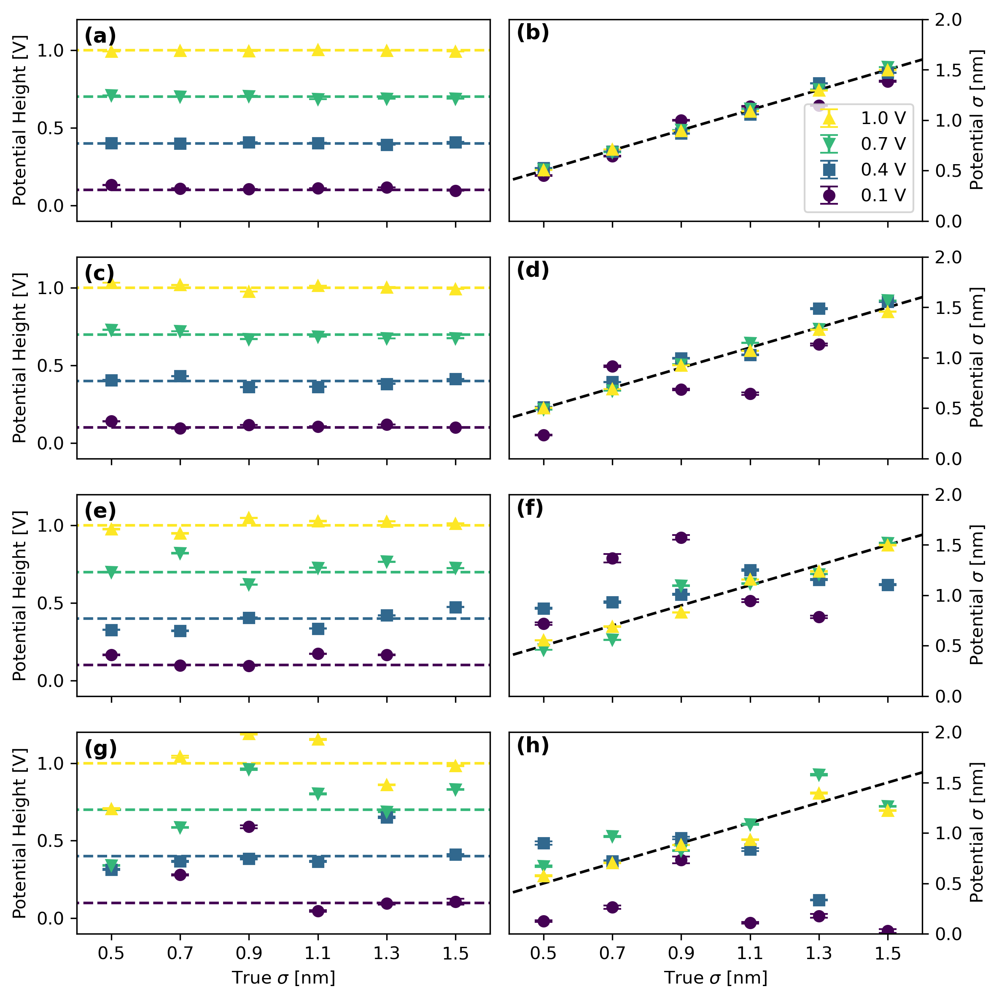

In [11]:
f, ax = plt.subplots(nrows=4, ncols=2, sharex='col', figsize=(8,8), dpi=300)
plot_color = plt.cm.viridis(np.linspace(0, 1, 4))
symbols = ['o', 's', 'v', '^']

texts1 = ['(a)', '(c)', '(e)', '(g)']
ind=0
for axis in ax[:,0].reshape(-1):
    for j in range(4):
        axis.plot(np.linspace(0, 1.6, 50), (0.3*j+0.1)*np.ones(50), '--', color=plot_color[j], label='_nolegend_')
        if ind==2 and j==0:
            axis.errorbar(np.arange(0.5, 1.4, 0.2), all_fit[ind,:5,j,0], yerr=all_err[ind,:5,j,0], 
                         fmt=symbols[j], capsize=5, color=plot_color[j])
        else:
            axis.errorbar(np.arange(0.5, 1.6, 0.2), all_fit[ind,:,j,0], yerr=all_err[ind,:,j,0], 
                         fmt=symbols[j], capsize=5, color=plot_color[j])
    #axis.set_title(noise[ind])
    axis.set_ylim(-0.1, 1.2)
    axis.set_xlim(0.4, 1.6)
    axis.set_xticks([0.5, 0.7, 0.9, 1.1, 1.3, 1.5])
    axis.text(0.42, 1.05, texts1[ind], color='black', fontsize='large', fontweight='bold')
    axis.set_ylabel('Potential Height [V]')
    ind+=1

texts2 = ['(b)', '(d)', '(f)', '(h)']
labels = ['0.1 V','0.4 V','0.7 V','1.0 V']
ind=0
for axis in ax[:,1].reshape(-1):
    axis.plot(np.linspace(0.1, 1.6, 50), np.linspace(0.1, 1.6, 50), '--k', label='_nolegend_')
    for i in range(4):
        if ind==2 and i==0:
            axis.errorbar(np.arange(0.5, 1.4, 0.2), all_fit[ind,:5,i,1]/10, yerr=all_err[ind,:5,i,1]/10, 
                         fmt=symbols[i], capsize=5, color=plot_color[i], label=labels[i])
        else:
            axis.errorbar(np.arange(0.5, 1.6, 0.2), all_fit[ind,:,i,1]/10, yerr=all_err[ind,:,i,1]/10, 
                         fmt=symbols[i], capsize=5, color=plot_color[i], label=labels[i])
    axis.set_ylim(0, 2)
    axis.set_xlim(0.4, 1.6)
    axis.set_xticks([0.5, 0.7, 0.9, 1.1, 1.3, 1.5])
    axis.yaxis.tick_right()
    axis.yaxis.set_label_position("right")
    axis.text(0.42, 1.8, texts2[ind], color='black', fontsize='large', fontweight='bold')
    axis.set_ylabel(r'Potential $\sigma$ [nm]')
    ind+=1
    
handles, labels = ax[0,1].get_legend_handles_labels()
ax[0,1].legend(reversed(handles), reversed(labels), loc='lower right') 
    
ax[-1,0].set_xlabel(r'True $\sigma$ [nm]')
ax[-1,1].set_xlabel(r'True $\sigma$ [nm]')

plt.tight_layout()
plt.savefig('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/4_Gaussian_fits.pdf')

In [60]:
V_part = ['a', 'c', 'e', 'g']
sig_part = ['b', 'd', 'f', 'h']
sig_true = np.arange(0.5, 1.6, 0.2)[:,np.newaxis]

headers_V = np.array([['sig_true', 'V_fit', 'V_err', 'V_fit', 'V_err', 'V_fit', 'V_err', 'V_fit', 'V_err'],
                    ['nm', 'V', 'V', 'V', 'V', 'V', 'V', 'V', 'V'],
                    ['', '0.1 V', '0.1 V', '0.4 V', '0.4 V', '0.7 V', '0.7 V', '1.0 V', '1.0 V']])

headers_sig = np.array([['sig_true', 'sig_fit', 'sig_err', 'sig_fit', 'sig_err', 'sig_fit', 'sig_err', 'sig_fit', 'sig_err'],
                    ['nm', 'nm', 'nm', 'nm', 'nm', 'nm', 'nm', 'nm', 'nm'],
                    ['', '0.1 V', '0.1 V', '0.4 V', '0.4 V', '0.7 V', '0.7 V', '1.0 V', '1.0 V']])

for i in range(4):
    str_V_array = np.char.mod("%10.6f", np.concatenate((sig_true, V_data[i,:,:]), axis=1))
    with open('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/figure_csv/4'+V_part[i]+'.csv', 'w') as f:
        np.savetxt(f, np.vstack((headers_V, str_V_array)), delimiter=', ', fmt='%s')

for i in range(4):
    str_sig_array = np.char.mod("%10.6f", np.concatenate((sig_true, sig_data[i,:,:]), axis=1))
    with open('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/figure_csv/4'+sig_part[i]+'.csv', 'w') as f:
        np.savetxt(f, np.vstack((headers_sig, str_sig_array)), delimiter=', ', fmt='%s')

In [61]:
from scipy.optimize import curve_fit
files = ['/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/ap_noise2/potential.npy',
         '/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/ap_noise5/potential.npy',
         '/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/ap_noise10/potential.npy',
         '/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/ap_noise20/potential.npy']

In [67]:
fit_all = np.zeros((4, 4, 256, 4))
err_all = np.zeros((4, 4, 256, 4))
for k in range(4):
    potential = np.load(files[k])
    for i in range(256):
        sig_start = i/25.5+5
        sig_guess = np.linspace(sig_start-2, sig_start+2, 5)
        for j in range(4):
            y_data = potential[i, j*128:(j+1)*128]
            x_data = np.arange(j*128,(j+1)*128)
            a_start = 0.3*j + 0.1
            a_guess = np.linspace(a_start-0.2, a_start+0.2, 5)
            mu_start = 128*j+64
            mu_guess = np.linspace(mu_start-5, mu_start+5, 5)
            c_guess = y_data.mean()
            ind=0
            result_int = np.zeros((125,4))
            err_int = np.zeros((125,4))
            for a in a_guess:
                for sig in sig_guess:
                    for mu in mu_guess:
                        try:
                            popt = curve_fit(gaussian, x_data, y_data, p0=(a, sig, mu, c_guess))
                            result_int[ind,:] = popt[0]
                            err_int[ind,:] = np.diag(popt[1])
                        except:
                            err_int[ind,:] = 1e9*np.ones(4)
                        ind+=1
            weights = 1/err_int
            fit_all[k,j,i,:] = np.sum(result_int*weights, axis=0)/np.sum(weights, axis=0)
            err_all[k,j,i,:] = 1/np.sqrt(np.sum(weights, axis=0))

/home/connor/anaconda3/envs/inline/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_4073/2408564829.py:29: RuntimeWarning: divide by zero encountered in divide
  weights = 1/err_int
/tmp/ipykernel_4073/2408564829.py:30: RuntimeWarning: invalid value encountered in divide
  fit_all[k,j,i,:] = np.sum(result_int*weights, axis=0)/np.sum(weights, axis=0)


In [68]:
V_diff = np.zeros((4,4,256))
V_diff[:,0,:] = fit_all[:,0,:,0] - 0.1
V_diff[:,1,:] = fit_all[:,1,:,0] - 0.4
V_diff[:,2,:] = fit_all[:,2,:,0] - 0.7
V_diff[:,3,:] = fit_all[:,3,:,0] - 1.0

In [23]:
mu = np.zeros(4)
sig = np.zeros(4)
for i in range(4):
    diff = V_diff[i,:,:]
    mu[i] = diff[abs(diff)<0.6].mean()
    sig[i] = diff[abs(diff)<0.6].std()

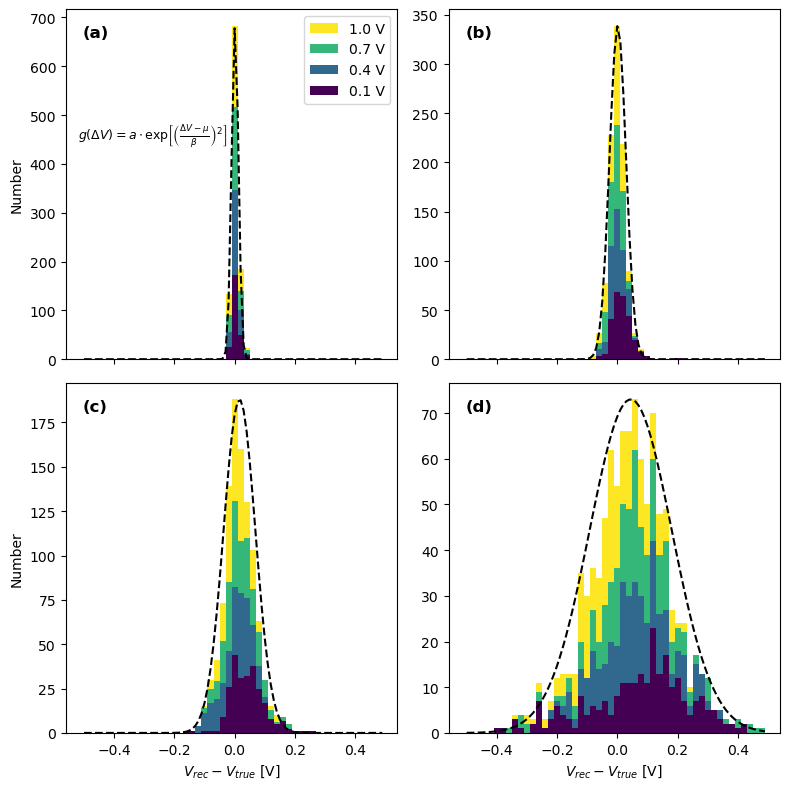

In [29]:
plot_color = plt.cm.viridis(np.linspace(0, 1, 4))
text = ['(a)', '(b)', '(c)', '(d)']
f, ax = plt.subplots(nrows=2, ncols=2, figsize=(8,8), sharex=True, dpi=100)
hist2 = ax[0,0].hist(V_diff[0].T, bins=np.arange(-0.51, 0.51, 0.02), histtype='bar', stacked=True, color=plot_color, label=['0.1 V', '0.4 V', '0.7 V', '1.0 V'])
hist5 = ax[0,1].hist(V_diff[1].T, bins=np.arange(-0.51, 0.51, 0.02), histtype='bar', stacked=True, color=plot_color)
hist10 = ax[1,0].hist(V_diff[2].T, bins=np.arange(-0.51, 0.51, 0.02), histtype='bar', stacked=True, color=plot_color)
hist20 = ax[1,1].hist(V_diff[3].T, bins=np.arange(-0.51, 0.51, 0.02), histtype='bar', stacked=True, color=plot_color);
handles, labels = ax[0,0].get_legend_handles_labels()
ax[0,0].legend(reversed(handles), reversed(labels))
plt.tight_layout()

a = np.zeros(4)
i=0
for hist in [hist2, hist5, hist10, hist20]:
    a[i] = hist[0].max()
    i+=1
x = np.arange(-0.5, 0.5, 0.01)
i=0
for axis in ax.reshape(-1):
    axis.plot(x, gaussian(x, a[i], sig[i], mu[i], 0), '--k')
    ymin, ymax = axis.get_ylim()
    xmin, xmax = axis.get_xlim()
    xpos = 0.05*(xmax-xmin)+xmin
    ypos = 0.92*(ymax-ymin)+ymin
    axis.text(xpos, ypos, text[i], color='black', fontsize='large', fontweight='bold')
    i+=1

ax[0,0].text(-0.52, 450, r'$g(ΔV)=a\cdot \mathrm{exp} \left[ \left(\frac{ΔV-μ}{β}\right)^{2} \right]$', fontsize=9)
ax[1,0].set_xlabel('$V_{rec}-V_{true}$'+' [V]')
ax[1,1].set_xlabel('$V_{rec}-V_{true}$'+' [V]')
ax[0,0].set_ylabel('Number')
ax[1,0].set_ylabel('Number')
plt.tight_layout()
#plt.savefig('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/S6_V_histogram.pdf')

In [43]:
data = np.zeros((50, 21))
x = np.arange(-0.50, 0.5, 0.02)
data[:,0] = x
data[:,1:5]  = hist2[0].T
data[:,6:10] = hist5[0].T
data[:,11:15] = hist10[0].T
data[:,16:20] = hist20[0].T

for i in range(4):
    data[:,5*(i+1)] = gaussian(x, a[i], sig[i], mu[i], 0)

headers = np.array([['V_rec - V_true', '0.1 V', '0.4 V', '0.7 V', '1.0 V', 'Gaussian', '0.1 V', '0.4 V', '0.7 V', '1.0 V', 'Gaussian',
                    '0.1 V', '0.4 V', '0.7 V', '1.0 V', 'Gaussian', '0.1 V', '0.4 V', '0.7 V', '1.0 V', 'Gaussian'],
                    ['V', 'Number', 'Number', 'Number', 'Number', 'Number', 'Number', 'Number', 'Number', 'Number', 'Number',
                    'Number', 'Number', 'Number', 'Number', 'Number', 'Number', 'Number', 'Number', 'Number', 'Number',],
                    ['', '2% Noise', '2% Noise', '2% Noise', '2% Noise', '2% Noise' , '5% Noise', '5% Noise', '5% Noise', '5% Noise', '5% Noise',
                    '10% Noise', '10% Noise', '10% Noise', '10% Noise', '10% Noise' , '20% Noise', '20% Noise', '20% Noise', '20% Noise', '20% Noise']])

str_array = np.char.mod("%10.6f", data)
with open('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/figure_csv/S6_V_histogram.csv', 'w') as f:
    np.savetxt(f, np.vstack((headers, str_array)), delimiter=', ', fmt='%s')

In [53]:
V_ci = 0.5*np.abs(mu)+2*sig
for i in range(4):
    print(np.sum(np.abs(V_diff[i])<V_ci[i])/(4*256))

0.9462890625
0.953125
0.9501953125
0.9521484375


In [72]:
sig_diff = np.zeros((4,4,256))
for i in range(256):
    sig_diff[:,:,i] = fit_all[:,:,i,1] - (i/25.5+5)

In [24]:
sig_mu = np.zeros((4,4))
sig_sig = np.zeros((4,4))
for i in range(4):
    for j in range(4):
        diff = sig_diff[i,j,:]
        sig_mu[i,j] = diff[abs(diff)<20].mean()
        sig_sig[i,i] = diff[abs(diff)<20].std()
sig_ci = 0.5*np.abs(sig_mu)+2*sig_sig

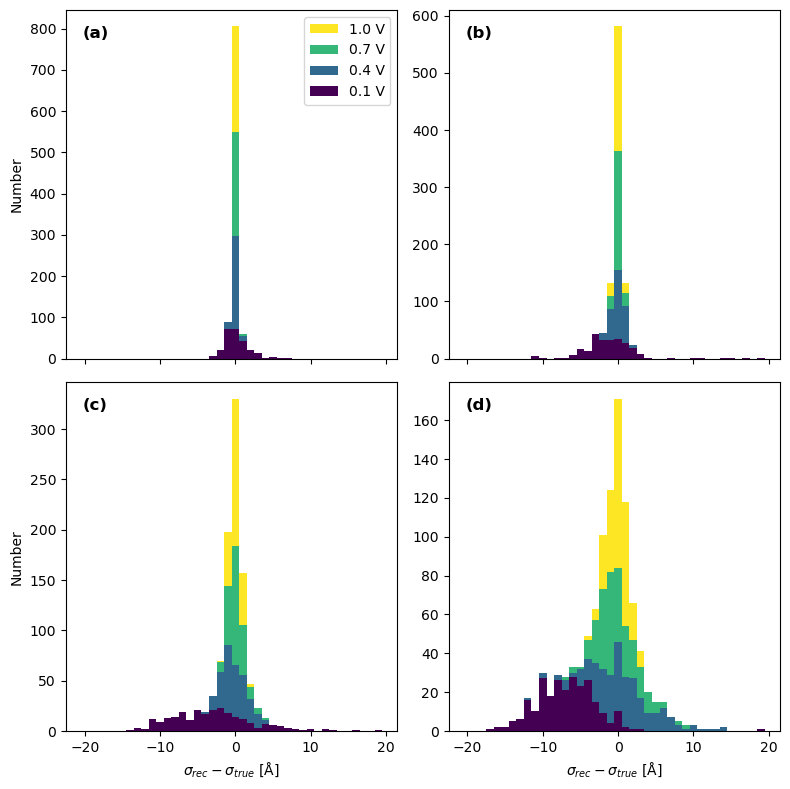

In [44]:
plot_color = plt.cm.viridis(np.linspace(0, 1, 4))
f, ax = plt.subplots(nrows=2, ncols=2, sharex=True, figsize=(8,8), dpi=100)
hist2 = ax[0,0].hist(sig_diff[0].T, bins=np.arange(-20.5, 20.5, 1), histtype='bar', stacked=True, color=plot_color, label=['0.1 V', '0.4 V', '0.7 V', '1.0 V'])
hist5 = ax[0,1].hist(sig_diff[1].T, bins=np.arange(-20.5, 20.5, 1), histtype='bar', stacked=True, color=plot_color)
hist10 = ax[1,0].hist(sig_diff[2].T, bins=np.arange(-20.5, 20.5, 1), histtype='bar', stacked=True, color=plot_color)
hist20 = ax[1,1].hist(sig_diff[3].T, bins=np.arange(-20.5, 20.5, 1), histtype='bar', stacked=True, color=plot_color);

handles, labels = ax[0,0].get_legend_handles_labels()
ax[0,0].legend(reversed(handles), reversed(labels))
i=0
for axis in ax.reshape(-1):
    ymin, ymax = axis.get_ylim()
    xmin, xmax = axis.get_xlim()
    xpos = 0.05*(xmax-xmin)+xmin
    ypos = 0.92*(ymax-ymin)+ymin
    axis.text(xpos, ypos, text[i], color='black', fontsize='large', fontweight='bold')
    i+=1
ax[1,0].set_xlabel('$σ_{rec}-σ_{true}$'+' [Å]')
ax[1,1].set_xlabel('$σ_{rec}-σ_{true}$'+' [Å]')
ax[0,0].set_ylabel('Number')
ax[1,0].set_ylabel('Number')
plt.tight_layout()
#plt.savefig('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/S8_sigma_histogram.pdf')

In [49]:
data = np.zeros((40, 17))
x = np.arange(-20, 20, 1)/10
data[:,0] = x
data[:,1:5]  = hist2[0].T
data[:,5:9] = hist5[0].T
data[:,9:13] = hist10[0].T
data[:,13:17] = hist20[0].T

headers = np.array([['sig_rec - sig_true', '0.1 V', '0.4 V', '0.7 V', '1.0 V', '0.1 V', '0.4 V', '0.7 V', '1.0 V',
                    '0.1 V', '0.4 V', '0.7 V', '1.0 V', '0.1 V', '0.4 V', '0.7 V', '1.0 V'],
                    ['nm', 'Number', 'Number', 'Number', 'Number', 'Number', 'Number', 'Number', 'Number',
                    'Number', 'Number', 'Number', 'Number', 'Number', 'Number', 'Number', 'Number',],
                    ['', '2% Noise', '2% Noise', '2% Noise', '2% Noise', '5% Noise', '5% Noise', '5% Noise', '5% Noise',
                    '10% Noise', '10% Noise', '10% Noise', '10% Noise', '20% Noise', '20% Noise', '20% Noise', '20% Noise']])

str_array = np.char.mod("%10.6f", data)
with open('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/figure_csv/S8_sig_histogram.csv', 'w') as f:
    np.savetxt(f, np.vstack((headers, str_array)), delimiter=', ', fmt='%s')

In [51]:
from scipy.stats import linregress

In [54]:
V_lin = linregress([0.02, 0.05, 0.1, 0.2], V_ci, alternative='greater')
x = np.concatenate((V_ci/0.1, V_ci/0.4, V_ci/0.7, V_ci))
y = np.concatenate((sig_ci[:,0]/10, sig_ci[:,1]/10, sig_ci[:,2]/10, sig_ci[:,3]/10))
sig_lin = linregress(x, y, alternative='greater')

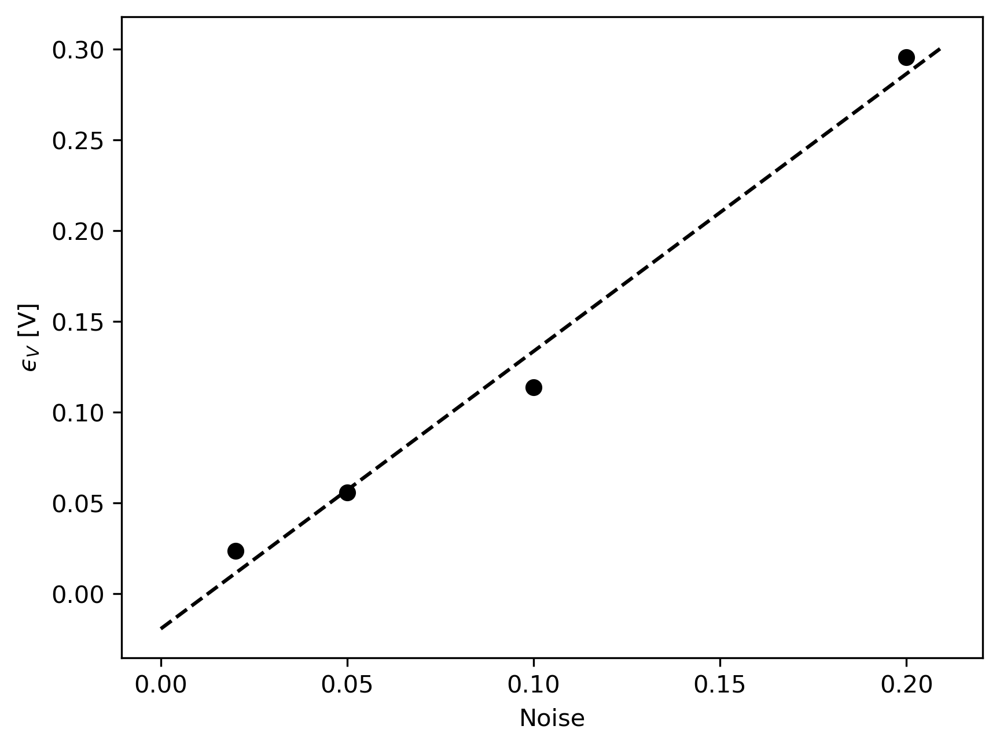

In [21]:
plt.figure(dpi=300)
plt.plot([0.02, 0.05, 0.1, 0.2], V_ci, 'ok')
plt.plot(np.arange(0, 0.22, 0.01), V_lin.slope*np.arange(0, 0.22, 0.01)+V_lin.intercept, '--k')
plt.xlabel('Noise')
plt.ylabel('$ϵ_{V}$'+' [V]')
plt.savefig('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/S7_V_confidence.pdf')

In [57]:
data = np.zeros((22, 4))
data[:4,0] = [0.02, 0.05, 0.1, 0.2]
data[:4,1] = V_ci
data[:,2] = np.arange(0, 0.22, 0.01)
data[:,3] =  V_lin.slope*np.arange(0, 0.22, 0.01)+V_lin.intercept

headers = np.array([['Noise', 'eps_V', 'Noise', 'eps_V'],
                    ['', 'V', '', 'V'],
                    ['', 'Rec', '', 'Linear Fit']])

str_array = np.char.mod("%10.6f", data)
with open('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/figure_csv/S7_V_confidence.csv', 'w') as f:
    np.savetxt(f, np.vstack((headers, str_array)), delimiter=', ', fmt='%s')

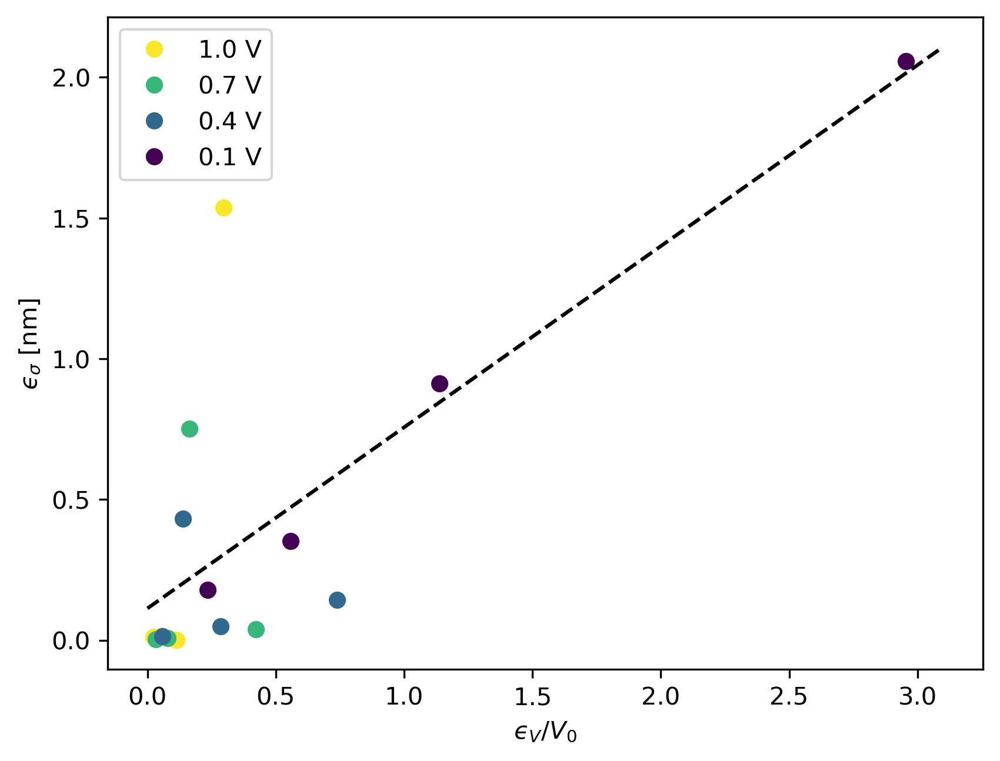

In [76]:
plot_color = plt.cm.viridis(np.linspace(0, 1, 4))
plt.figure(dpi=300)
plt.plot(V_ci, 6*sig_ci[:,3]/10, 'o', color=plot_color[3])
plt.plot(V_ci/0.7, 6*sig_ci[:,2]/10, 'o', color=plot_color[2])
plt.plot(V_ci/0.4, 6*sig_ci[:,1]/10, 'o', color=plot_color[1])
plt.plot(V_ci/0.1, 6*sig_ci[:,0]/10, 'o', color=plot_color[0])

plt.legend(['1.0 V', '0.7 V', '0.4 V', '0.1 V'])
plt.plot(np.arange(0, 3.2, 0.1), 6*sig_lin.slope*np.arange(0, 3.2, 0.1)+6*sig_lin.intercept, '--k')
plt.xlabel('$ϵ_{V}/V_{0}$')
plt.ylabel('$ϵ_{σ}$'+' [nm]')
plt.savefig('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/S9_sigma_confidence.pdf')

In [60]:
data = np.zeros((32, 10))
data[:4,0] = V_ci/0.1
data[:4,1] = 6*sig_ci[:,0]/10
data[:4,2] = V_ci/0.4
data[:4,3] = 6*sig_ci[:,1]/10
data[:4,4] = V_ci/0.7
data[:4,5] = 6*sig_ci[:,2]/10
data[:4,6] = V_ci
data[:4,7] = 6*sig_ci[:,3]/10
data[:,8] = np.arange(0, 3.2, 0.1)
data[:,9] = 6*sig_lin.slope*np.arange(0, 3.2, 0.1)+6*sig_lin.intercept

headers = np.array([['eps_V/V_0', 'eps_sig', 'eps_V/V_0', 'eps_sig', 'eps_V/V_0', 'eps_sig',
                    'eps_V/V_0', 'eps_sig', 'eps_V/V_0', 'eps_sig'],
                    ['', 'nm', '', 'nm', '', 'nm', '', 'nm', '', 'nm'],
                    ['0.1 V', '0.1 V', '0.4 V', '0.4 V', '0.7 V', '0.7 V', '1.0 V', '1.0 V', 'Linear Fit', 'Linear Fit']])

str_array = np.char.mod("%10.6f", data)
with open('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/figure_csv/S9_sig_confidence.csv', 'w') as f:
    np.savetxt(f, np.vstack((headers, str_array)), delimiter=', ', fmt='%s')

# Amplitude Thickness Mapping

In [15]:
amp_all = np.zeros((5, 1024, 1024))
amp_all[0] = np.load('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/ap_noise0/amp.npy')
amp_all[1] = np.load('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/ap_noise2/amp.npy')
amp_all[2] = np.load('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/ap_noise5/amp.npy')
amp_all[3] = np.load('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/ap_noise10/amp.npy')
amp_all[4] = np.load('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/ap_noise20/amp.npy')

In [16]:
amp_denoised = np.zeros((5, 1024, 1024))
for i in range(5):
    weight = amp_all[i, 384:-384, 256:-256].std()
    amp_denoised[i] = denoise_tv_chambolle(amp_all[i], weight=weight)

In [17]:
t_raw = np.log(amp_all[2])*-200
t_denoised = np.log(amp_denoised[2])*-200

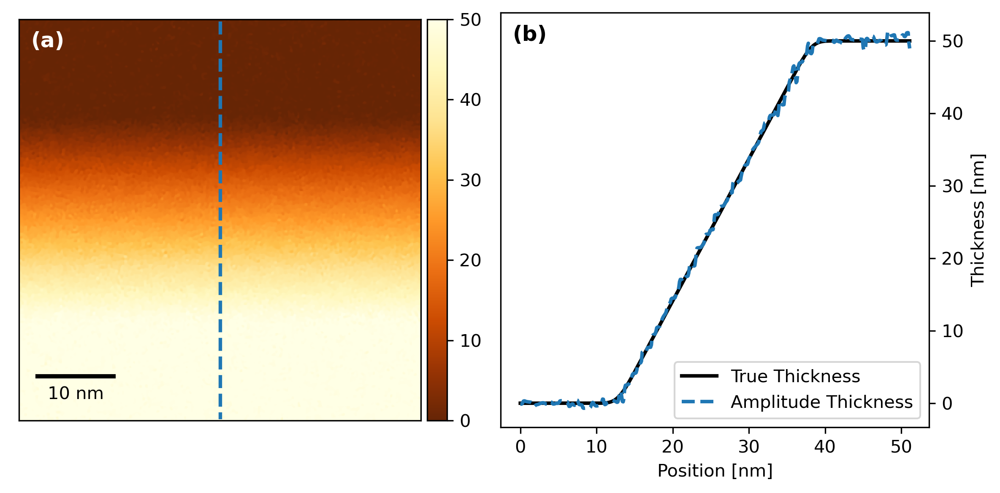

In [53]:
f, ax = plt.subplots(ncols=2, figsize=(8,4), dpi=300)

im1 = ax[0].imshow(t_denoised[:512,256:-256], interpolation='none', cmap='YlOrBr_r', vmin=true_thickness[:512,256:-256].min(), vmax=true_thickness[:512,256:-256].max())
ax[0].set_xticks([])
ax[0].set_yticks([])
divider1 = make_axes_locatable(ax[0])
cax1 = divider1.append_axes("right", size="5%", pad=0.05)
f.colorbar(im1, cax=cax1)
ax[0].vlines(256, 2, 510, colors=['tab:blue'], linestyles='dashed', lw=2)
bar1 = AnchoredSizeBar(ax[0].transData, 100, '10 nm', loc=3, pad=0.5, borderpad=0.5, sep=5, frameon=False, size_vertical=3)
ax[0].add_artist(bar1)
ax[0].text(15, 35, '(a)', color='white', fontsize='large', fontweight='bold')

ax[1].plot(np.arange(0, 51.2, 0.1), true_thickness[:512,512],'-k', lw=2)
ax[1].plot(np.arange(0, 51.2, 0.1), t_denoised[:512,512], '--', color='tab:blue', lw=2)
ax[1].yaxis.tick_right()
ax[1].yaxis.set_label_position("right")
ax[1].legend(['True Thickness', 'Amplitude Thickness',], loc='lower right', fontsize=10)
ax[1].set_xlabel('Position [nm]')
ax[1].set_ylabel('Thickness [nm]')
ax[1].text(-1, 50, '(b)', color='black', fontsize='large', fontweight='bold');
#ax[1].set_ylim(24, 26)
plt.tight_layout()
plt.savefig('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/S11_thickness_noise5.pdf')

In [21]:
data = np.zeros((512, 3))
data[:,0] = np.arange(0, 51.2, 0.1)
data[:,1] = true_thickness[:512,512]
data[:,2] = t_denoised[:512,512]

headers = np.array([['Position', 'True thickness', 'Amplitude thickness'],
                    ['nm', 'nm', 'nm'],
                    ['', '', '5% Noise']])

str_array = np.char.mod("%10.6f", data)
with open('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/figure_csv/S11.csv', 'w') as f:
    np.savetxt(f, np.vstack((headers, str_array)), delimiter=', ', fmt='%s')

# Plots

In [51]:
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import patches
from matplotlib.gridspec import GridSpec

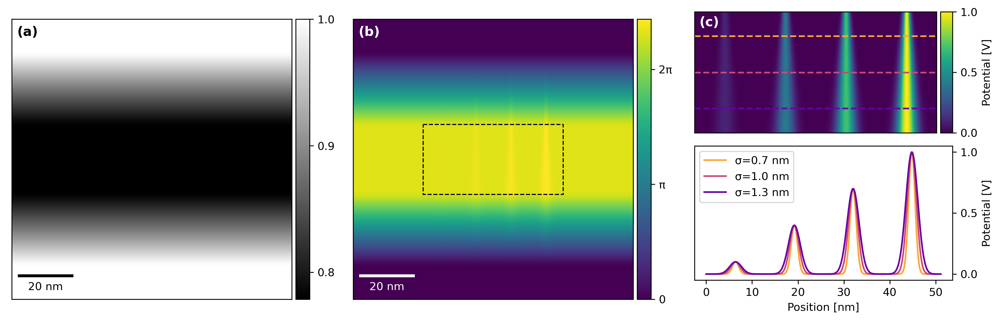

In [242]:
plot_color = plt.cm.plasma(np.linspace(0.8, 0.2, 3))
f = plt.figure(figsize=(12.6,4), dpi=300, layout='constrained')
subfigs = f.subfigures(1, 3, wspace=0.1)

ax0 = subfigs[0].subplots(1,1)
im0 = ax0.imshow(true_amp, cmap='gray')
ax0.set_xticks([])
ax0.set_yticks([])
divider0 = make_axes_locatable(ax0)
cax0 = divider0.append_axes("right", size="5%", pad=0.05)
f.colorbar(im0, cax=cax0, ticks=[0.8, 0.9, 1.0])
bar0 = AnchoredSizeBar(ax0.transData, 200, '20 nm', loc=3, pad=0.1, borderpad=0.5, sep=5, frameon=False, size_vertical=6)
ax0.add_artist(bar0)
ax0.text(20, 60, '(a)', color='black', fontsize='large', fontweight='bold')

ax1 = subfigs[1].subplots(1,1)
im1 = ax1.imshow(true_phase)
ax1.set_xticks([])
ax1.set_yticks([])
divider1 = make_axes_locatable(ax1)
cax1 = divider1.append_axes("right", size="5%", pad=0.05)
cbar1 = f.colorbar(im1, cax=cax1, ticks=[0, np.pi, 2*np.pi])
cbar1.ax.set_yticklabels(['0', 'π', '2π'])
rect = patches.Rectangle((256,384), 512, 256, ec='black', ls='--', fc=None, fill=False)
ax1.add_patch(rect)
bar1 = AnchoredSizeBar(ax1.transData, 200, '20 nm', loc=3, pad=0.1, borderpad=0.5, sep=5, frameon=False, size_vertical=6, color='white')
ax1.add_artist(bar1)
ax1.text(20, 60, '(b)', color='white', fontsize='large', fontweight='bold')

ax2 = subfigs[2].subplots(2,1)
im2 = ax2[0].imshow(true_potential[384:-384,256:-256])
ax2[0].set_xticks([])
ax2[0].set_yticks([])
divider2 = make_axes_locatable(ax2[0])
cax2 = divider2.append_axes("right", size="5%", pad=0.05)
cbar2 = f.colorbar(im2, cax=cax2, ticks=[0, 0.5, 1])
cbar2.set_label('Potential [V]')
ax2[0].plot(np.arange(0, 512), 51*np.ones(512), '--', color=plot_color[0])
ax2[0].plot(np.arange(0, 512), 128*np.ones(512), '--', color=plot_color[1])
ax2[0].plot(np.arange(0, 512), 204*np.ones(512), '--', color=plot_color[2])
#bar2 = AnchoredSizeBar(ax2[0].transData, 100, '10 nm', loc=3, pad=0.1, borderpad=0.3, sep=5, frameon=False, size_vertical=3, color='white')
#ax2[0].add_artist(bar2)
ax2[0].text(10, 30, '(c)', color='white', fontsize='large', fontweight='bold')

ax2[1].plot(np.arange(0, 51.2, 0.1), true_potential[435,256:-256], color=plot_color[0])
ax2[1].plot(np.arange(0, 51.2, 0.1), true_potential[512,256:-256], color=plot_color[1])
ax2[1].plot(np.arange(0, 51.2, 0.1), true_potential[588,256:-256], color=plot_color[2])
ax2[1].set_yticks([0, 0.5, 1])
ax2[1].yaxis.tick_right()
ax2[1].legend(['σ=0.7 nm', 'σ=1.0 nm', 'σ=1.3 nm'])
ax2[1].set_xlabel('Position [nm]')
ax2[1].set_ylabel('Potential [V]')
ax2[1].yaxis.set_label_position("right")
#ax2[1].text(0, 1.2, '(d)', color='black', fontsize='large', fontweight='bold')
#plt.tight_layout()
#plt.savefig('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Images/1_sample_design_lg.pdf')

In [6]:
V_filtered_crop2 = np.load('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/ap_noise2/potential.npy')
V_filtered_crop5 = np.load('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/ap_noise5/potential.npy')
V_filtered_crop10 = np.load('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/ap_noise10/potential.npy')
V_filtered_crop20 = np.load('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/ap_noise20/potential.npy')
ap_sig_V_err = np.load('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/ap_gaussian_err.npy')
ap_sig_V_fit = np.load('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/ap_gaussian_fit.npy')

In [7]:
params = ap_sig_V_fit[1:3,2,:,:]
err = ap_sig_V_err[1:3,2,:,:]

In [9]:
def gaussian(x, a, sig, mu, c):
    return a*np.exp(-0.5*((x-mu)/sig)**2) + c

In [10]:
line_profile5 = np.zeros(512)
line_profile10 = np.zeros(512)
for i in range(4):
    gauss5 = gaussian(np.arange(i*128,(i+1)*128), params[0,i,0], params[0,i,1], params[0,i,2], params[0,i,3])
    line_profile5[i*128:(i+1)*128] = gauss5
    gauss10 = gaussian(np.arange(i*128,(i+1)*128), params[1,i,0], params[1,i,1], params[1,i,2], params[1,i,3])
    line_profile10[i*128:(i+1)*128] = gauss10

In [11]:
true_V_crop = np.copy(true_potential[384:-384, 256:-256])
true_V_crop -= true_V_crop.mean()
shift = -(true_V_crop.min())
true_V_crop += shift
cmax = true_V_crop.max()
cmin = true_V_crop.min()

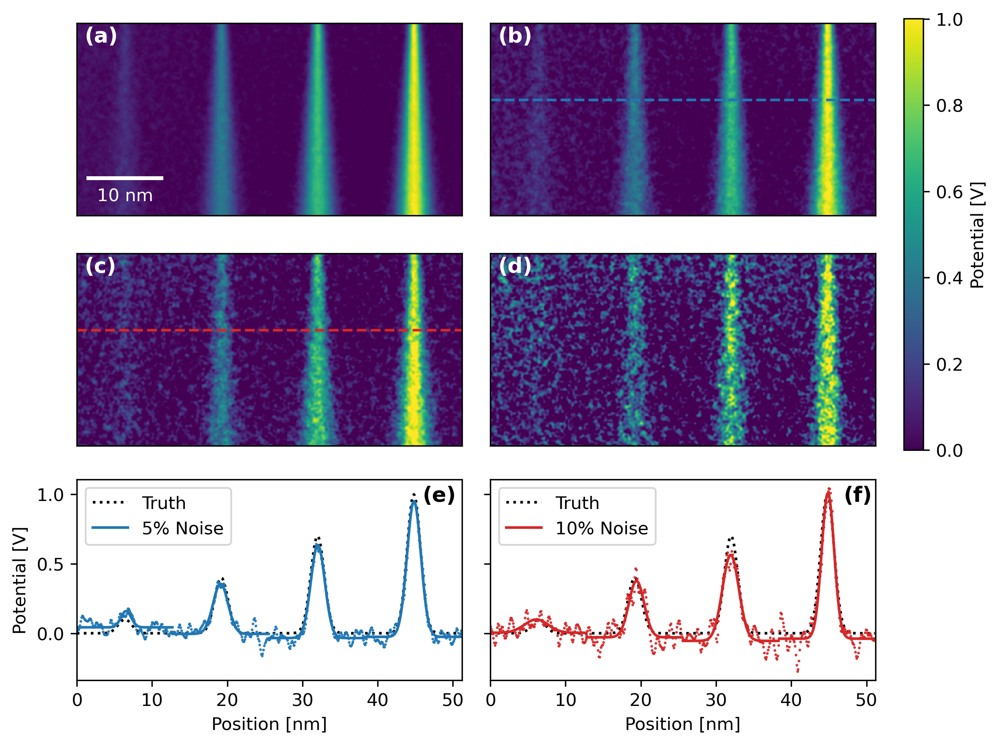

In [59]:
f = plt.figure(figsize=(8,6), dpi=300)
gs = GridSpec(3, 3, width_ratios=[1,1,0.05], height_ratios=[1,1,1])
ax0 = f.add_subplot(gs[0, 0])
ax1 = f.add_subplot(gs[0, 1], sharey=ax0)
ax2 = f.add_subplot(gs[1, 0])
ax3 = f.add_subplot(gs[1, 1], sharey=ax2)
cax0 = f.add_subplot(gs[:2,2])
ax4 = f.add_subplot(gs[2, 0])
ax5 = f.add_subplot(gs[2, 1], sharey=ax4)

ax = np.array([ax0, ax1, ax2, ax3])

im0 = ax0.imshow(V_filtered_crop2+shift, interpolation='None', vmin=cmin, vmax=cmax)
im1 = ax1.imshow(V_filtered_crop5+shift, interpolation='None', vmin=cmin, vmax=cmax)
im2 = ax2.imshow(V_filtered_crop10+shift, interpolation='None', vmin=cmin, vmax=cmax)
im3 = ax3.imshow(V_filtered_crop20+shift, interpolation='None', vmin=cmin, vmax=cmax)

ax1.plot(np.arange(0, 512), 102*np.ones(512), '--', color='tab:blue')
ax2.plot(np.arange(0, 512), 102*np.ones(512), '--', color='tab:red')
labels = ['(a)','(b)','(c)','(d)']
ind=0
for axis in ax:
    axis.set_xticks([])
    axis.set_yticks([])
    axis.text(10, 25, labels[ind], color='white', fontsize='large', fontweight='bold')
    ind+=1

#divider0 = make_axes_locatable(ax0)
#cax0 = divider0.append_axes("right", size="5%", pad=0.05)
cbar0 = f.colorbar(im0, cax=cax0)
cbar0.set_label('Potential [V]', rotation=90)

bar0 = AnchoredSizeBar(ax0.transData, 100, '10 nm', loc=3, pad=0.1, borderpad=0.5, sep=5, frameon=False, size_vertical=3, color='white')
ax0.add_artist(bar0)


ax4.plot(np.arange(0, 51.2, 0.1), true_V_crop[102, :], ':k', label='Truth')
ax5.plot(np.arange(0, 51.2, 0.1), true_V_crop[102, :], ':k', label='Truth')
ax4.plot(np.arange(0, 51.2, 0.1), V_filtered_crop5[102, :]+shift, 'o', markersize=0.5, color='tab:blue', label='5% Noise')
ax5.plot(np.arange(0, 51.2, 0.1), V_filtered_crop10[102, :]+shift, 'o', markersize=0.5, color='tab:red', label='10% Noise')

for i in range(4):
    x = np.arange(128*i, 128*(i+1))
    ax4.plot(x/10, line_profile5[x]+shift,'-', color='tab:blue', label='5% Gaussian Fits')
    ax5.plot(x/10, line_profile10[x]+shift,'-', color='tab:red', label='10% Gaussian Fits')
ax4.set_xlim(0, 51.2)
ax4.set_xlabel('Position [nm]')
ax4.set_ylabel('Potential [V]')
ax5.set_xlim(0, 51.2)
ax5.set_xlabel('Position [nm]')

plt.setp(ax5.get_yticklabels(), visible=False)

handles, labels = ax4.get_legend_handles_labels()
ax4.legend([handles[idx] for idx in [0,2]],[labels[idx] for idx in [0,1]]) 
ax4.text(46, 0.95, '(e)', color='black', fontsize='large', fontweight='bold')

handles, labels = ax5.get_legend_handles_labels()
ax5.legend([handles[idx] for idx in [0,2]],[labels[idx] for idx in [0,1]]) 
ax5.text(47, 0.95, '(f)', color='black', fontsize='large', fontweight='bold')

f.tight_layout()
plt.savefig('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/3_Gaussian_fits_sm.pdf')

In [14]:
data = np.zeros((512, 6))
data[:,0] = np.arange(0, 51.2, 0.1)
data[:,1] = true_V_crop[102, :]
data[:,2] = V_filtered_crop5[102, :]+shift
data[:,3] = line_profile5+shift
data[:,4] = V_filtered_crop10[102, :]+shift
data[:,5] = line_profile10+shift

headers = np.array([['Position', 'V_true', 'V_rec', 'V_fit', 'V_rec', 'V_fit'],
                    ['nm', 'V', 'V', 'V', 'V', 'V'],
                    ['', '', '5% Noise', '5% Noise', '10% Noise', '10% Noise']])

str_array = np.char.mod("%10.6f", data)
with open('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/figure_csv/3.csv', 'w') as f:
    np.savetxt(f, np.vstack((headers, str_array)), delimiter=', ', fmt='%s')

In [61]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

/tmp/ipykernel_161614/313855102.py:15: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


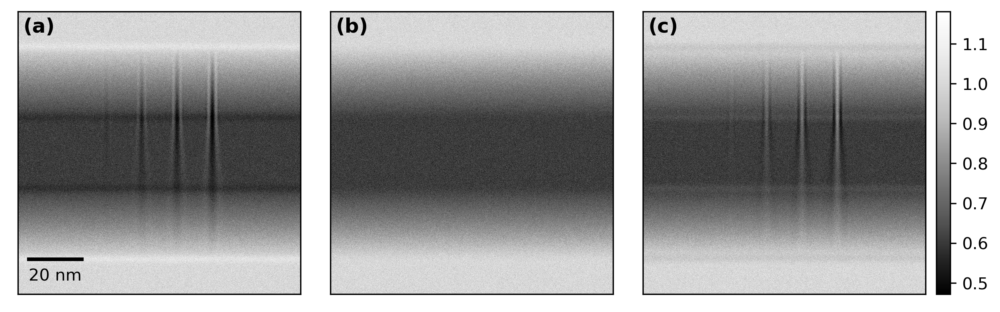

In [64]:
f, ax = plt.subplots(ncols=3, figsize = (8,8/3), dpi=300)
im0 = ax[0].imshow(A_samples[35], vmin=A_samples[25].min(), vmax=A_samples[25].max(), interpolation='none', cmap='Greys_r')
im1 = ax[1].imshow(A_samples[25], interpolation='none', cmap='Greys_r')
im2 = ax[2].imshow(A_samples[15], vmin=A_samples[25].min(), vmax=A_samples[25].max(), interpolation='none', cmap='Greys_r')
for axis in ax.reshape(-1):
    axis.set_xticks([])
    axis.set_yticks([])
bar = AnchoredSizeBar(ax[0].transData, 200, '20 nm', loc=3, pad=0.1, borderpad=0.5, sep=5, frameon=False, size_vertical=6)
ax[0].add_artist(bar)
ax[0].text(20, 75, '(a)', color='black', fontsize='large', fontweight='bold')
ax[1].text(20, 75, '(b)', color='black', fontsize='large', fontweight='bold')
ax[2].text(20, 75, '(c)', color='black', fontsize='large', fontweight='bold')
axins = inset_axes(ax[2], width="5%", height="100%", loc='center right', borderpad=-1.5)
f.colorbar(im2, cax=axins, orientation="vertical")
plt.tight_layout()
plt.savefig('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Images/noise5.pdf', bbox_inches='tight')

/tmp/ipykernel_161614/1702076628.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


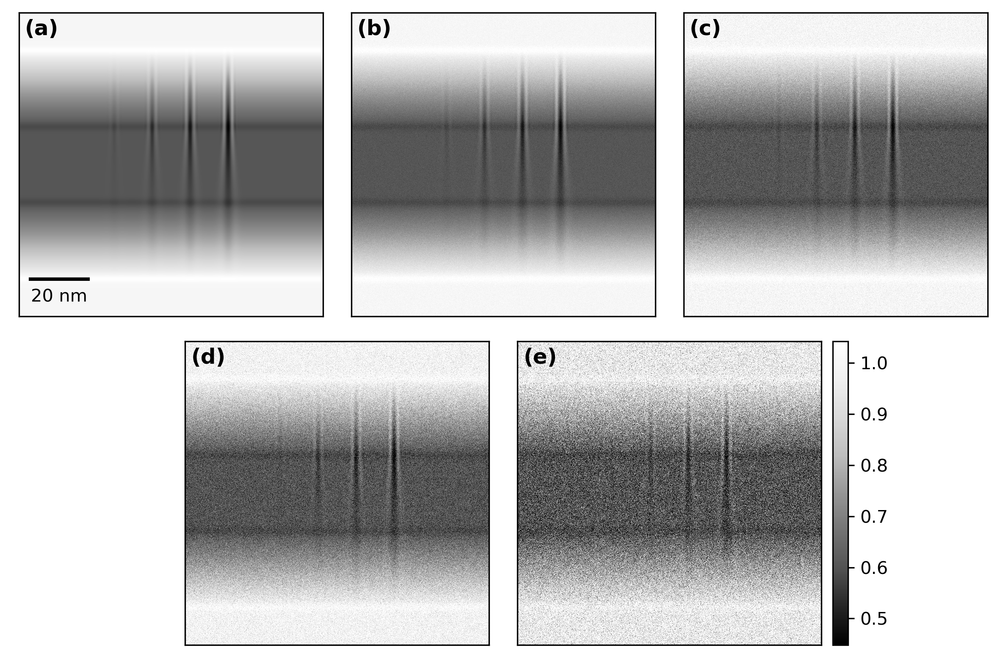

In [71]:
f = plt.figure(figsize=(8,16/3), dpi=300)
gs = GridSpec(2, 6)
ax0 = f.add_subplot(gs[0,:2])
ax1 = f.add_subplot(gs[0,2:4])
ax2 = f.add_subplot(gs[0,4:])
ax3 = f.add_subplot(gs[1,1:3])
ax4 = f.add_subplot(gs[1,3:5])
ax = np.array([ax0, ax1, ax2, ax3, ax4])

im0 = ax[0].imshow(noise0, interpolation='none', cmap='Greys_r')
ax[1].imshow(noise2, interpolation='none', cmap='Greys_r', vmin=noise0.min(), vmax=noise0.max())
ax[2].imshow(noise5, interpolation='none', cmap='Greys_r', vmin=noise0.min(), vmax=noise0.max())
ax[3].imshow(noise10, interpolation='none', cmap='Greys_r', vmin=noise0.min(), vmax=noise0.max())
im4 = ax[4].imshow(noise20, interpolation='none', cmap='Greys_r', vmin=noise0.min(), vmax=noise0.max())

for axis in ax.reshape(-1):
    axis.set_xticks([])
    axis.set_yticks([])
bar = AnchoredSizeBar(ax[0].transData, 200, '20 nm', loc=3, pad=0.1, borderpad=0.5, sep=5, frameon=False, size_vertical=6)
ax[0].add_artist(bar)
ax[0].text(20, 75, '(a)', color='black', fontsize='large', fontweight='bold')
ax[1].text(20, 75, '(b)', color='black', fontsize='large', fontweight='bold')
ax[2].text(20, 75, '(c)', color='black', fontsize='large', fontweight='bold')
ax[3].text(20, 75, '(d)', color='black', fontsize='large', fontweight='bold')
ax[4].text(20, 75, '(e)', color='black', fontsize='large', fontweight='bold')
axins = inset_axes(ax[4], width="5%", height="100%", loc='center right', borderpad=-1.5)
f.colorbar(im0, cax=axins, orientation="vertical")
plt.tight_layout()
plt.savefig('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Images/def-1um.pdf', bbox_inches='tight')

# Sensitivity to Aberrations

In [24]:
ObjWave = true_amp * (np.cos(true_phase) + 1j * np.sin(true_phase))
dim = 1024
d2=dim//2
line = np.arange(dim)-float(d2)
[X,Y] = np.meshgrid(line,line)
qq = np.sqrt(X**2 + Y**2) / float(dim)

# define pixel resolution in nm.
del_px = 0.1 #nm/px

#Exponential defocus series
index = np.arange(1.2, 6.2, 0.2)
defocus=np.zeros(2*len(index)+1)
defocus[-len(index):] = 10**index
index = np.flip(index)
defocus[:len(index)] = -10**index
defocus = [defocus[11], defocus[21], defocus[25], defocus[29], defocus[39]]
print("Defocus values: ",defocus)
n_def = len(defocus)

Defocus values:  [-6309.57344480193, -63.0957344480193, 0.0, 63.0957344480193, 6309.57344480193]


In [25]:
t1 = np.copy(true_potential[384:-384, 256:-256])
t1 -= t1.mean()
shift = -t1.min()
t1 += shift

In [26]:
def make_pnoise(image, noise_level):
    lam = 1/(factor*noise_level**2)
    image_n_filt = np.random.poisson(image * lam) / float(lam)
    return image_n_filt

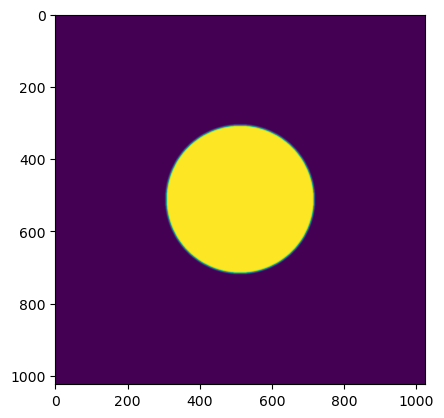

In [34]:
aperture = np.zeros([1024, 1024])
line = np.arange(-512,512)
[X,Y] = np.meshgrid(line,line)
aperture[np.sqrt(X**2+Y**2)<1024./5]=1
aperture = ndimage.gaussian_filter(aperture, sigma=2)
plt.imshow(aperture)

In [27]:
def wave_correct(amp, phase, ap):
    wave = amp * np.exp(1j*phase)
    wave_fft = np.fft.fftshift(np.fft.fft2(wave))
    wave_filtered = np.fft.ifft2(np.fft.fftshift(ap*wave_fft))
    t2 = unwrap_phase(np.angle(wave_filtered))
    t2 -= t2[:64,:64].mean()
    return t2[384:-384, 256:-256]

In [32]:
def compute_loss():
    tf_obj = guess_amp * torch.exp(1j*guess_phase)
    cal_data = torch.fft.ifft2(torch.fft.fft2(tf_obj)*TF)
    cal_data = torch.abs(cal_data)
    cal_data /= torch.mean(cal_data, dim=(1,2), keepdims=True)
    return torch.mean((cal_data - exp_data)**2)

In [30]:
def training_loop(optimizer, scheduler, n=1000):
    "Training loop for torch model."
    losses = np.zeros(n)
    for i in range(n):
        loss = compute_loss()
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        scheduler.step(loss)
        losses[i] = loss
    return losses

In [28]:
def reconstruct(TEM, A_samples):
    global TF
    global exp_data
    global guess_amp
    global guess_phase
    
    TEM.setAperture(qq, del_px, 0.01)
    tf_microscope = np.zeros(A_samples.shape, dtype=np.complex64)
    for i in range(len(defocus)):
        TEM.defocus = defocus[i]
        tf_microscope[i,:,:] = TEM.getTransferFunction(qq, del_px)
    TF = torch.tensor(fftshift(tf_microscope, axes=(1,2)), dtype=torch.complex64, device=device)
    exp_data = torch.tensor(np.sqrt(A_samples), dtype=torch.float32, device=device)
    exp_data /= torch.mean(exp_data, dim=(1,2), keepdims=True)
    
    weight = np.sqrt(A_samples[2,384:-384,256:-256]).std()
    guess_amp = denoise_tv_chambolle(np.sqrt(A_samples[2]), weight=weight)
    guess_phase = torch.tensor(TEM.sigma*np.log(guess_amp)*-200*20, dtype=torch.float32, requires_grad=True, device=device)
    guess_amp = torch.tensor(guess_amp, dtype=torch.float32, requires_grad=True, device=device)
    all_losses = np.array([]) 
    
    opt = torch.optim.Adam([guess_phase], lr=0.1, eps=1e-16)
    opt.add_param_group({'params': guess_amp,
                        'lr': 0.1,
                        'eps': 1e-16})
    scheduler1 = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, mode='min', factor=0.5, patience=50, threshold=0.0001, threshold_mode='rel', cooldown=50, min_lr=0, eps=1e-6, verbose=False)
    losses = training_loop(opt, scheduler1, n=1000)
    all_losses = np.append(all_losses, losses)
    
    phase = guess_phase.cpu().detach().numpy()
    amp = guess_amp.cpu().detach().numpy()
    phase = unwrap_phase(phase)
    t2 = wave_correct(amp, phase, aperture)
    t2 = t2/(TEM.sigma*true_thickness[384:-384,256:-256])
    t2 -= t2.mean()
    t2 += shift
    
    return t2
            

In [35]:
A_samples = np.zeros([n_def,dim,dim])
factor = true_amp[384:-384,:].mean()**2
Cs = np.arange(0.2, 2.2, 0.2)
acc_Cs = np.zeros(Cs.shape)

for c in range(len(Cs)):
    TEM = Microscope(Cs = Cs[c], theta_c = 0.1e-3, def_spr = 5)
    TEM.setAperture(qq, del_px, 0.5) #0.5 nm aperture
    
    for i in range(n_def):
        TEM.defocus = defocus[i]
        A_samples[i,:,:] = make_pnoise(TEM.getImage(ObjWave, qq, del_px), 0.05)
    t2 = reconstruct(TEM, A_samples)
    acc_Cs[c] = 1 - np.arccos(np.sum(t1*t2)/(np.sqrt(np.sum(t1**2)) * np.sqrt(np.sum(t2**2))))/np.pi

In [47]:
A_samples = np.zeros([n_def,dim,dim])
theta_c = np.array([0.001, 0.002, 0.005, 0.01, 0.02, 0.05, 0.1, 0.2, 0.5])*1e-3
acc_theta = np.zeros(theta_c.shape)

for t in range(len(theta_c)):
    TEM = Microscope(Cs = 1.0e6, theta_c = theta_c[t], def_spr = 5)
    TEM.setAperture(qq, del_px, 0.5) #0.5 nm aperture
    
    for i in range(n_def):
        TEM.defocus = defocus[i]
        A_samples[i,:,:] = make_pnoise(TEM.getImage(ObjWave, qq, del_px), 0.05)
    t2 = reconstruct(TEM, A_samples)
    acc_theta[t] = 1 - np.arccos(np.sum(t1*t2)/(np.sqrt(np.sum(t1**2)) * np.sqrt(np.sum(t2**2))))/np.pi

In [39]:
A_samples = np.zeros([n_def,dim,dim])
def_spr = np.arange(2, 22, 2)
acc_def_spr = np.zeros(def_spr.shape)

for d in range(len(def_spr)):
    TEM = Microscope(Cs = 1.0e6, theta_c = 0.1e-3, def_spr = def_spr[d])
    TEM.setAperture(qq, del_px, 0.5) #0.5 nm aperture
    
    for i in range(n_def):
        TEM.defocus = defocus[i]
        A_samples[i,:,:] = make_pnoise(TEM.getImage(ObjWave, qq, del_px), 0.05)
    t2 = reconstruct(TEM, A_samples)
    acc_def_spr[d] = 1 - np.arccos(np.sum(t1*t2)/(np.sqrt(np.sum(t1**2)) * np.sqrt(np.sum(t2**2))))/np.pi

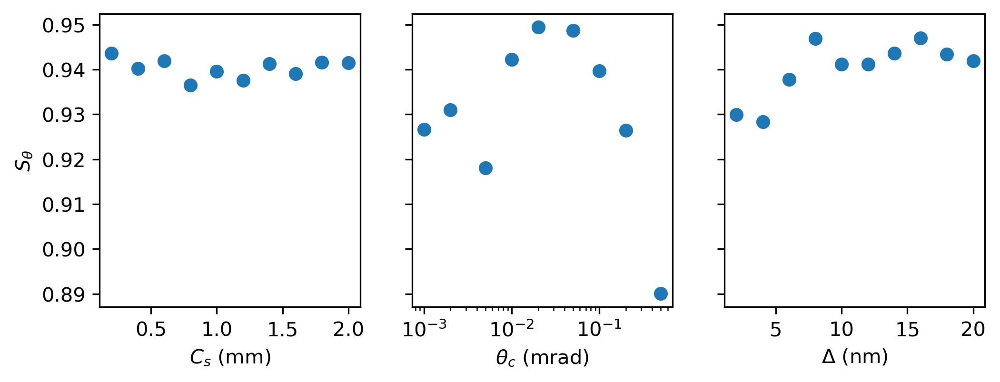

In [57]:
f, ax = plt.subplots(ncols=3, figsize=(8, 8/3), sharey=True, dpi=300)
ax[0].plot(Cs, acc_Cs, 'o')
ax[0].set_xlabel('$C_{s}$'+' (mm)')
ax[0].set_ylabel('$S_{θ}$')

ax[1].semilogx(theta_c*1e3, acc_theta, 'o')
ax[1].set_xlabel('$θ_{c}$'+' (mrad)')
ax[1].set_xticks([0.001, 0.01, 0.1])

ax[2].plot(def_spr, acc_def_spr, 'o')
ax[2].set_xlabel('$Δ$'+' (nm)')

plt.savefig('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/S4_aberrations.pdf', bbox_inches='tight')

In [59]:
s4_all = np.zeros((10, 6))
s4_all[:,0] = Cs
s4_all[:,1] = acc_Cs
s4_all[:9,2] = theta_c
s4_all[:9,3] = acc_theta
s4_all[:,4] = def_spr
s4_all[:,5] = acc_def_spr
headers= np.array([['Cs', 'theta_s', 'theta_c', 'theta_s', 'delta', 'theta_s'],
                    ['mm', '', 'rad', '', 'nm', '']])
str_s4_array = np.char.mod("%10.6f", s4_all)
with open('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/figure_csv/S4.csv', 'w') as f:
    np.savetxt(f, np.vstack((headers, str_s4_array)), delimiter=', ', fmt='%s')

# Optimum Thickness

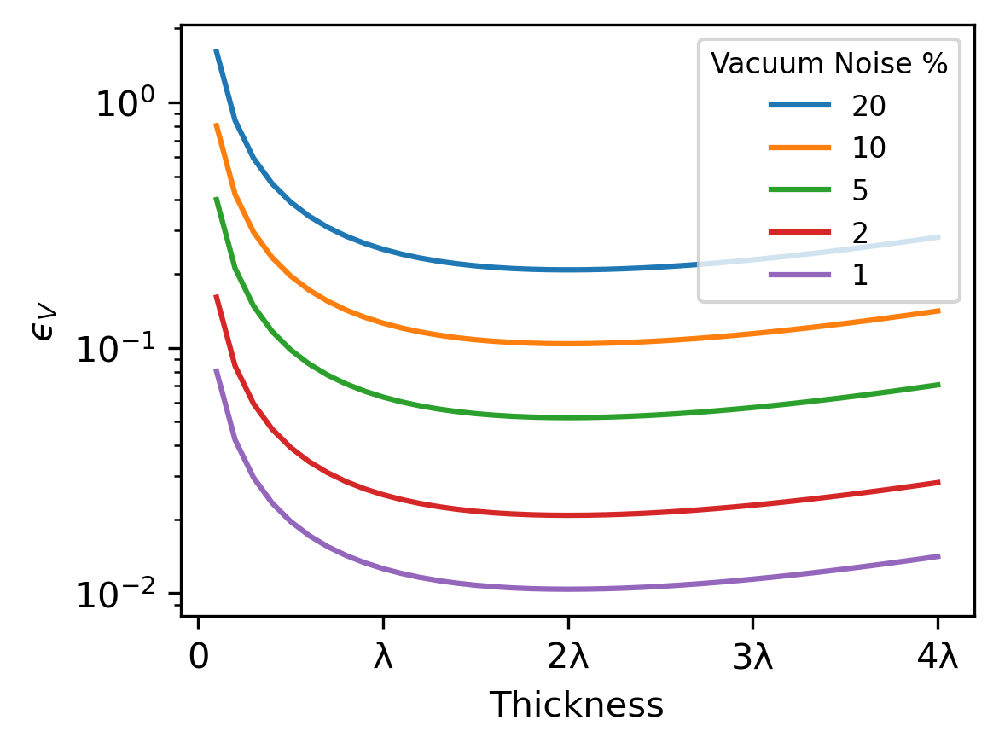

In [22]:
plt.figure(figsize=(4,3), dpi=300)
t = np.arange(10, 410, 10)
noise = np.array([20, 10, 5, 2, 1])
eps_v = np.zeros((len(t), len(noise)))
for i in range(len(noise)):
    #snr = TEM.sigma*t*0.5/(0.557*np.exp(t/200)*n)
    eps_v[:,i] = (0.557*np.exp(t/200)*noise[i]/100)/(TEM.sigma*t)
    plt.semilogy(t, eps_v[:,i])
plt.xticks(ticks=[0, 100, 200, 300, 400], labels=['0', 'λ', '2λ', '3λ', '4λ'])
plt.xlabel('Thickness')
plt.ylabel('$ϵ_{V}$')
plt.legend(noise, title='Vacuum Noise %', fontsize=8, title_fontsize=8)
#plt.savefig('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/S10_thickness_opt.pdf', bbox_inches='tight')

In [60]:
t = np.arange(10, 410, 10)[:,np.newaxis]

headers= np.array([['thickness', 'eps_V', 'eps_V', 'eps_V', 'eps_V', 'eps_V'],
                    ['nm', 'V', 'V', 'V', 'V', 'V'],
                    ['', '20% Noise', '10% Noise', '5% Noise', '2% Noise', '1% Noise']])
str_eps_V_array = np.char.mod("%10.6f", np.concatenate((t, eps_v), axis=1))
with open('/home/connor/Documents/Phase_Reconstruction/GB Simulation/Sim_Results/figure_csv/S10.csv', 'w') as f:
    np.savetxt(f, np.vstack((headers, str_eps_V_array)), delimiter=', ', fmt='%s')